In [ ]:
import argparse
import os
import numpy as np
import math
import sys
import torchvision.transforms as transforms
from torchvision.utils import save_image
from torch.utils.data import DataLoader
from torchvision import datasets
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
import torch
import torchvision.utils as vutils
import numpy as np
import torch
import torch.nn as nn
import os
import csv
from PIL import Image, ImageEnhance
import numbers
import pandas as pd
import torchvision.transforms as transforms
import torch.utils.data as data
from torch.autograd import Variable
import matplotlib.pyplot as plt
from torch import autograd

img_shape = (1, 128, 128)

cuda = True if torch.cuda.is_available() else False

def weights_init_uniform(m):
    if isinstance(m, nn.Conv2d):
        nn.init.kaiming_uniform(m.weight.data)
        m.bias.data.fill_(0.1)

    if isinstance(m, nn.Linear):
        nn.init.kaiming_uniform(m.weight.data)
        m.bias.data.fill_(0.1)


# block 32 64 128 256 represent how many channel for conv3 in this block 
# and the image dimension after convolution is presented
class Block32(nn.Module):
    def __init__(self):
        super().__init__()
        self.block = nn.Sequential(
            # input --> 1 * 128 * 128
            nn.Conv2d(1, 32, kernel_size=3, stride=1, padding=0),  # 32 * 126 * 126
            # normalization
            nn.BatchNorm2d(32, eps=1e-5),
            #  activate function
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=0),  # 32 * 124 * 124
            nn.BatchNorm2d(32, eps=1e-5),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        output = self.block(x)
        return output


class Block64(nn.Module):
    def __init__(self):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=0),  # 64 * 61 * 61
            nn.BatchNorm2d(64, eps=1e-5),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=0),  # 64 * 59 * 59
            nn.BatchNorm2d(64, eps=1e-5),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=0),  # 64 * 57 * 57
            nn.BatchNorm2d(64, eps=1e-5),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        output = self.block(x)
        return output


class Block128(nn.Module):
    def __init__(self):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=0),  # 128 * 28 * 28
            nn.BatchNorm2d(128, eps=1e-5),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=0),  # 128 * 26 * 26
            nn.BatchNorm2d(128, eps=1e-5),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=0),  # 128 * 24 * 24
            nn.BatchNorm2d(128, eps=1e-5),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=0),  # 128 * 22 * 22
            nn.BatchNorm2d(128, eps=1e-5),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        output = self.block(x)
        return output


class Block256(nn.Module):
    def __init__(self):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=0),  # 256 * 10 * 10
            nn.BatchNorm2d(256, eps=1e-5),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=0),  # 256 * 8 * 8
            nn.BatchNorm2d(256, eps=1e-5),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=0),  # 256 * 6 * 6
            nn.BatchNorm2d(256, eps=1e-5),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=0),  # 256 * 4 * 4
            nn.BatchNorm2d(256, eps=1e-5),
            nn.ReLU(inplace=True)
            # nn.Conv2d(256, 256, kernel_size=4, stride=1, padding=0),  # 256 * 1 * 1
            # nn.BatchNorm2d(256, eps=1e-5),
            # nn.ReLU(inplace=True)
        )

    def forward(self, x):
        output = self.block(x)
        return output


# channelattention
class ChannelAttention(nn.Module):
    def __init__(self, kernel):
        super(ChannelAttention, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.fc1 = nn.Conv2d(kernel, kernel // 8, 1, bias=False)
        self.relu1 = nn.ReLU()
        self.fc2 = nn.Conv2d(kernel // 8, kernel, 1, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = self.fc2(self.relu1(self.fc1(self.avg_pool(x))))
        max_out = self.fc2(self.relu1(self.fc1(self.max_pool(x))))
        out = avg_out + max_out
        return x * self.sigmoid(out)


# spatialattention(I did try to combine CA with SA but the result was not very good as espected)
class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()
        assert kernel_size in (3, 7), 'kernel size must be 3 or 7'
        padding = 3 if kernel_size == 7 else 1
        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        y = torch.cat([avg_out, max_out], dim=1)
        y = self.conv1(y)
        return x * self.sigmoid(y)


class Siamese_VGG(nn.Module):
    def __init__(self, drop, use_w_init=True):
        super().__init__()

        # blocks
        self.block32 = Block32()
        self.block64 = Block64()
        self.block128 = Block128()
        self.block256 = Block256()

        # only one fully connecter was used
        self.final = nn.Sequential(
            nn.Dropout(p=drop),
            # combine all features to 2 dimention because of binaire classfication
            nn.Linear(32 + 64 + 128 + 256, 2)
        )

        # initialization of the weights and bias 
        if use_w_init:
            self.apply(weights_init_uniform)

        # channel attention
        self.attention32 = ChannelAttention(32)
        self.attention64 = ChannelAttention(64)
        self.attention128 = ChannelAttention(128)
        self.attention256 = ChannelAttention(256)

    def forward(self, x1, x2):
        # forward propagation
        o1 = self.block32(x1)
        o2 = self.block32(x2)
        att_o1 = self.attention32(o1)
        att_o2 = self.attention32(o2)
        # use GAP to extract the features after the block
        feats1_1 = torch.nn.functional.adaptive_avg_pool2d(o1, (1, 1))
        feats1_2 = torch.nn.functional.adaptive_avg_pool2d(o2, (1, 1))
        # use add bit-by-bit to combine 2 GAP
        feats1 = feats1_1.view((feats1_1).size(0), -1) + feats1_2.view((feats1_2).size(0), -1)

        # now input = output from last block + channel attention
        o1 = self.block64(o1 + att_o1)
        o2 = self.block64(o2 + att_o2)
        att_o1 = self.attention64(o1)
        att_o2 = self.attention64(o2)
        feats2_1 = torch.nn.functional.adaptive_avg_pool2d(o1, (1, 1))
        feats2_2 = torch.nn.functional.adaptive_avg_pool2d(o2, (1, 1))
        feats2 = feats2_1.view((feats2_1).size(0), -1) + feats2_2.view((feats2_2).size(0), -1)

        o1 = self.block128(o1 + att_o1)
        o2 = self.block128(o2 + att_o2)
        att_o1 = self.attention128(o1)
        att_o2 = self.attention128(o2)
        feats3_1 = torch.nn.functional.adaptive_avg_pool2d(o1, (1, 1))
        feats3_2 = torch.nn.functional.adaptive_avg_pool2d(o2, (1, 1))
        feats3 = feats3_1.view((feats3_1).size(0), -1) + feats3_2.view((feats3_2).size(0), -1)

        o1 = self.block256(o1 + att_o1)
        o2 = self.block256(o2 + att_o2)
        # att_o1 = self.attention256(o1)
        # att_o2 = self.attention256(o2)
        feats4_1 = torch.nn.functional.adaptive_avg_pool2d(o1, (1, 1))
        feats4_2 = torch.nn.functional.adaptive_avg_pool2d(o2, (1, 1))
        feats4 = feats4_1.view((feats4_1).size(0), -1) + feats4_2.view((feats4_2).size(0), -1)  #

        # combine all GAPs to get the final features
        feats_final = torch.cat([feats1, feats2], 1)
        feats_final = torch.cat([feats_final, feats3], 1)
        feats_final = torch.cat([feats_final, feats4], 1)

        return self.final(feats_final), feats_final
    
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        self.main = nn.Sequential(
            # k+(in-1)s-2p
            nn.ConvTranspose2d(2048, 128*32, 4, 1, 0, bias=False), # 4096, 4, 4
            nn.BatchNorm2d(128 * 32),
            nn.ReLU(True),
            nn.ConvTranspose2d(128*32, 128 * 16, 4, 2, 1, bias=False), # 2048, 8, 8 # 8
            nn.BatchNorm2d(128 * 16),
            nn.ReLU(True),
            # input is Z, going into a convolution
            nn.ConvTranspose2d(128 * 16, 128 * 8, 4, 2, 0, bias=False), # 1024, 20, 20 # 18
            nn.BatchNorm2d(128 * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(128 * 8, 128 * 4, 4, 2, 1, bias=False), # 512, 40, 40 # 36
            nn.BatchNorm2d(128 * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(128 * 4, 128 * 2, 4, 2, 0, bias=False), # 256, 80, 80 # 74
            nn.BatchNorm2d(128 * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(128 * 2, 128, 4, 2, 1, bias=False), # 128, 160, 160 # 128, # 148
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d(128, 1, 7, 2, 1, bias=False), # 1, 320, 320   # 1,299,299 # 299
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, z):
        # print(z.shape)
        img = self.main(z)
        # print(img.size())
        # img = img.view(img.shape[0], *img_shape)
        return img

    
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        self.encoder1 = nn.Sequential(
            # input is 1 x 128 x 128 1*299*299
            nn.Conv2d(1, 32, 3, 2, 0, bias=False),  # 32*63*63 32*149*149
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(32, 32 * 2, 3, 2, 0, bias=False),  # 64*31*31 64*74*74
            nn.BatchNorm2d(32 * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(32 * 2, 32 * 4, 3, 2, 0, bias=False),  # 128*15*15 128*36*36
            nn.BatchNorm2d(32 * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(32 * 4, 32 * 8, 3, 2, 0, bias=False),  # 256*7*7 256*17*17
            nn.BatchNorm2d(32 * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(32 * 8, 32 * 16, 3, 2, 0, bias=False),  # 512*3*3 512 * 8 * 8
            nn.BatchNorm2d(32 * 16),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(32 * 16, 32 * 32, 3, 2, 0, bias=False),  # 1024*1*1 1024 * 3* 3
            nn.BatchNorm2d(32 * 32),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(32 * 32, 32 * 64, 3, 2, 0, bias=False),  # 2048*1*1 2048 * 1* 1
            nn.BatchNorm2d(32 * 64),
            nn.LeakyReLU(0.2, inplace=True),
        )
        self.encoder2 = nn.Sequential(
            # input is 1 x 128 x 128
            nn.Conv2d(1, 32, 3, 2, 0, bias=False),  # 32*63*63
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(32, 32 * 2, 3, 2, 0, bias=False),  # 64*31*31
            nn.BatchNorm2d(32 * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(32 * 2, 32 * 4, 3, 2, 0, bias=False),  # 128*15*15
            nn.BatchNorm2d(32 * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(32 * 4, 32 * 8, 3, 2, 0, bias=False),  # 256*7*7
            nn.BatchNorm2d(32 * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(32 * 8, 32 * 16, 3, 2, 0, bias=False),  # 512*3*3
            nn.BatchNorm2d(32 * 16),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(32 * 16, 32 * 32, 3, 2, 0, bias=False),  # 1024*1*1
            nn.BatchNorm2d(32 * 32),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(32 * 32, 32 * 64, 3, 2, 0, bias=False),  # 1024*1*1
            nn.BatchNorm2d(32 * 64),
            nn.LeakyReLU(0.2, inplace=True),
        )
    def forward(self, img):
        # print(img.size())
        output1 = self.encoder1(img)
        output2 = self.encoder2(img)
        return output1,output2
    
    
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


def get_pair(I):
    s = I.size[0]
    pad = int(np.floor(s / 3))
    ps = 128
    l = I.crop([0, pad, ps, pad + ps])
    m = I.crop([s - ps, pad, s, pad + ps])
    m = m.transpose(Image.FLIP_LEFT_RIGHT)

    return l, m


class KneeGradingDataset(data.Dataset):
    def __init__(self, dataset, transform, augment, stage='train'):
        super(KneeGradingDataset, self).__init__()
        self.dataset = dataset
        # self.train_files = train_files
        self.transform = transform
        self.augment = augment
        self.stage = stage
        if self.stage == 'train':
            self.images, self.labels = self.load_csv("paper_0_2_100000.csv")
        if self.stage == 'valid':
            self.images, self.labels = self.load_csv("trainData_0_2.csv")

    def load_csv(self, filename):
        images, labels = [], []
        with open(os.path.join(self.dataset, filename)) as f:
            reader = csv.reader(f)
            for row in reader:
                img_0, l_0, img_2, l_2 = row
                # print(img_0, img_2)
                label_0 = int(l_0)
                label_2 = int(l_2)       
                images.append([img_0, img_2])
                labels.append([label_0,label_2])
                #print(labels)
                #break
        return images, labels

    def __getitem__(self, index):
        img_0, img_2, label_0, label_2 = self.images[index][0], self.images[index][1], self.labels[index][0],self.labels[index][1]
        fname = os.path.join(self.dataset, img_0[0], img_0)
        fname2 = os.path.join(self.dataset, img_2[0], img_2)
        img = Image.open(fname)
        img2 = Image.open(fname2)
        img = self.augment(img)
        img2 = self.augment(img2)
        
        l, m = get_pair(img)
        l2, m2 = get_pair(img2)
        
        l = self.transform(l)
        m = self.transform(m)
        
        l2 = self.transform(l2)
        m2 = self.transform(m2)
        
        img = self.transform(img)
        img2 = self.transform(img2)
        # print(label_0)
        return img, img2, l, m, l2, m2, label_0, label_2

    def __len__(self):
        # return len(self.train_files)
        return 100000


class CenterCrop(object):
    def __init__(self, size):
        if isinstance(size, numbers.Number):
            self.size = (int(size), int(size))
        else:
            self.size = size

    def __call__(self, img):
        w, h = img.size
        tw, th, = self.size
        x1 = int(round((w - tw) / 2.))
        y1 = int(round((h - th) / 2.))
        return img.crop((x1, y1, x1 + tw, y1 + th))


class distance_loss(nn.Module):
    def __init__(self):
        super(distance_loss, self).__init__()

    def forward(self, x1,x2):
        mean_no_related = torch.mean(x1)
        mean_key = torch.mean(x2)
        var_no_related = torch.var(x1)
        var_key = torch.var(x2)
        
        loss = (var_no_related + var_key) / torch.square(mean_no_related - mean_key)

        return loss.mean()

def get_pair_Tensor(I):
    tensor_l = torch.flip(I[:,:,100:228,171:299][0].cpu(), [-1]).unsqueeze(1)
    tensor_m = I[:,:,100:228,0:128][0].unsqueeze(1)
    for i in range(I.shape[0]-1):
        tensor_l = torch.cat((tensor_l, torch.flip(I[:,:,100:228,171:299][i+1].cpu(), [-1]).unsqueeze(1)), 0)
        tensor_m = torch.cat((tensor_m, I[:,:,100:228,0:128][i+1].unsqueeze(1)), 0) 

    return tensor_l,tensor_m

# Initialize generator and discriminator
# discriminator = Discriminator()
discriminator2 = Siamese_VGG(0.2)
encoder = Encoder()
decoder = Decoder()

CUDA = 0

if cuda:
    #discriminator.cuda(CUDA)
    #discriminator.apply(weights_init)
    discriminator2.cuda(CUDA)
    discriminator2.apply(weights_init)
    encoder.cuda(CUDA)
    encoder.apply(weights_init)
    decoder.cuda(CUDA)
    decoder.apply(weights_init)

# Configure data loader
train_cats_length = []
val_length = []
test_length = []

transf_tens = transforms.Compose([
    transforms.ToTensor()
])
augment_transforms = transforms.Compose([
    CenterCrop(299)
])

train_ds = KneeGradingDataset('./OAI_m', transform=transf_tens, augment=augment_transforms, stage='train')
train_loader = data.DataLoader(train_ds, batch_size=64, shuffle=True)

#optimizer_D = torch.optim.Adam(discriminator.parameters(),lr=0.0002)
optimizer_D_ = torch.optim.Adam(discriminator2.parameters(),lr=0.0001)
optimizer_E = torch.optim.Adam(encoder.parameters(),lr=0.0001)
optimizer_DE = torch.optim.Adam(decoder.parameters(),lr=0.0001)

Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

# ----------
#  Training
# ----------

batches_done = 0
device = torch.device("cuda:" + str(CUDA) if (torch.cuda.is_available()) else "cpu")

loss_Ds = []
loss_Gs = []
mse = nn.MSELoss()
loss_Dis = distance_loss()

loss_Ds = []
loss_Rs = []
loss_Distances = []
loss_CEs = []

for epoch in range(100):
    for i, (img, img2, l, m, l2, m2, label_0, label_2) in enumerate(train_loader):
        # print(label_0)
        img0 = Variable(img.cuda(CUDA))
        img2 = Variable(img2.cuda(CUDA))
        l0 = Variable(l.cuda(CUDA))
        l2 = Variable(l2.cuda(CUDA))
        m0 = Variable(m.cuda(CUDA))
        m2 = Variable(m2.cuda(CUDA))
        label_0 = Variable(label_0.long().cuda(CUDA))
        label_2 = Variable(label_2.long().cuda(CUDA))
        # real_imgs = torch.cat((real_imgs_l,real_imgs_r),dim=0)    
        
        vector_Key0 = encoder(img0)[0]   
        vector_Unrelated0 = encoder(img0)[1]        
        vector_img0 = vector_Key0 + vector_Unrelated0
        
        vector_Key2 = encoder(img2)[0]
        vector_Unrelated2 = encoder(img2)[1]        
        vector_img2 = vector_Key2 + vector_Unrelated2
        
        vector_Key_Exchange_img0 = vector_Key2 + vector_Unrelated0
        vector_Key_Exchange_img2 = vector_Key0 + vector_Unrelated2
        
        R_img0 = decoder(vector_img0)
        R_img2 = decoder(vector_img2)
        
        Key_Exchange_img0 = decoder(vector_Key_Exchange_img0)
        Key_Exchange_img2 = decoder(vector_Key_Exchange_img2)
        
        # print(Key_Exchange_img0.size())
        Key_Exchange_img0_l = get_pair_Tensor(Key_Exchange_img0)[0].cuda(CUDA)
        Key_Exchange_img0_m = get_pair_Tensor(Key_Exchange_img0)[1].cuda(CUDA)
        
        Key_Exchange_img2_l = get_pair_Tensor(Key_Exchange_img2)[0].cuda(CUDA)
        Key_Exchange_img2_m = get_pair_Tensor(Key_Exchange_img2)[1].cuda(CUDA)
        
        optimizer_D_.zero_grad()
        
        for p in discriminator2.parameters():
            p.requires_grad = True
            
        loss_D1 = F.cross_entropy(discriminator2(l0,m0)[0],label_0)
        loss_D2 = F.cross_entropy(discriminator2(l2,m2)[0],label_2)
        loss_D = loss_D1 + loss_D2
        loss_Ds.append(loss_D)
        loss_D.backward()
        optimizer_D_.step()
        
        #loss_Ds.append(loss_D)
        
        optimizer_E.zero_grad()
        optimizer_DE.zero_grad()
        
        for p in discriminator2.parameters():
            p.requires_grad = False
            
        loss_distance0 = loss_Dis(vector_Key0, vector_Unrelated0)
        loss_distance2 = loss_Dis(vector_Key2, vector_Unrelated2)
        
        loss_distance = loss_distance0 + loss_distance2
        loss_Distances.append(loss_distance)
        
        loss_R0 = mse(img0, R_img0)
        loss_R2 = mse(img2, R_img2)
        
        loss_R = loss_R0 + loss_R2
        loss_Rs.append(loss_R)
        
        loss_ce0 = F.cross_entropy(discriminator2(Key_Exchange_img0_l, Key_Exchange_img0_m)[0],label_2)
        loss_ce2 = F.cross_entropy(discriminator2(Key_Exchange_img2_l, Key_Exchange_img2_m)[0],label_0)
        
        loss_ce = loss_ce0 + loss_ce2
        loss_CEs.append(loss_ce)
        
        loss_total = loss_R + 0.0001 * loss_distance + 0.001 * loss_ce
        loss_total.backward()
        
        #loss_Gs.append(loss_G)
        
        optimizer_E.step()
        optimizer_DE.step()
        
        print("[Epoch %d/%d] [Batch %d/%d] [loss_R: %f][loss_D: %f][loss_Dis: %f][loss_CE: %f]" % (epoch, 100, batches_done % len(train_loader), len(train_loader),loss_R.item(), loss_D.item(),loss_distance.item(),loss_ce.item()))
        batches_done += 1
        
    if epoch % 10 == 0 and epoch != 0:
        torch.save(encoder, 'paper_CAE_encoder_epoch_' + str(batches_done) + '.pth')
        torch.save(decoder,'paper_CAE_decoder_epoch_' + str(batches_done) + '.pth')
        torch.save(discriminator2,'paper_CAE_siamese_epoch_' + str(batches_done) + '.pth')

/tmp/ipykernel_1996578/2092458788.py:35: UserWarning: nn.init.kaiming_uniform is now deprecated in favor of nn.init.kaiming_uniform_.
  nn.init.kaiming_uniform(m.weight.data)
/tmp/ipykernel_1996578/2092458788.py:39: UserWarning: nn.init.kaiming_uniform is now deprecated in favor of nn.init.kaiming_uniform_.
  nn.init.kaiming_uniform(m.weight.data)


[Epoch 0/100] [Batch 0/1563] [loss_R: 1.347336][loss_D: 2.171789][loss_Dis: 25814576.000000][loss_CE: 1.886519]
[Epoch 0/100] [Batch 1/1563] [loss_R: 1.021815][loss_D: 1.922916][loss_Dis: 14860511.000000][loss_CE: 1.839677]
[Epoch 0/100] [Batch 2/1563] [loss_R: 0.782881][loss_D: 1.710443][loss_Dis: 3484533.500000][loss_CE: 1.771148]
[Epoch 0/100] [Batch 3/1563] [loss_R: 0.611499][loss_D: 1.725123][loss_Dis: 210302.687500][loss_CE: 1.773071]
[Epoch 0/100] [Batch 4/1563] [loss_R: 0.507698][loss_D: 1.499148][loss_Dis: 42157100.000000][loss_CE: 1.921228]
[Epoch 0/100] [Batch 5/1563] [loss_R: 0.387169][loss_D: 1.488227][loss_Dis: 246253.625000][loss_CE: 1.536649]
[Epoch 0/100] [Batch 6/1563] [loss_R: 0.327882][loss_D: 1.477777][loss_Dis: 179360.609375][loss_CE: 1.623906]
[Epoch 0/100] [Batch 7/1563] [loss_R: 0.252728][loss_D: 1.587041][loss_Dis: 143729.656250][loss_CE: 1.616789]
[Epoch 0/100] [Batch 8/1563] [loss_R: 0.200898][loss_D: 1.846293][loss_Dis: 166050.656250][loss_CE: 1.620753]
[Ep

[Epoch 0/100] [Batch 74/1563] [loss_R: 0.014569][loss_D: 1.618376][loss_Dis: 355339.312500][loss_CE: 1.718882]
[Epoch 0/100] [Batch 75/1563] [loss_R: 0.015362][loss_D: 1.543184][loss_Dis: 590843.625000][loss_CE: 1.495797]
[Epoch 0/100] [Batch 76/1563] [loss_R: 0.015496][loss_D: 1.578621][loss_Dis: 123261.031250][loss_CE: 1.676931]
[Epoch 0/100] [Batch 77/1563] [loss_R: 0.013417][loss_D: 1.619177][loss_Dis: 769467.687500][loss_CE: 1.548361]
[Epoch 0/100] [Batch 78/1563] [loss_R: 0.015159][loss_D: 1.557956][loss_Dis: 7995958.500000][loss_CE: 1.633294]
[Epoch 0/100] [Batch 79/1563] [loss_R: 0.017852][loss_D: 1.498877][loss_Dis: 259913.078125][loss_CE: 1.432630]
[Epoch 0/100] [Batch 80/1563] [loss_R: 0.013477][loss_D: 1.426176][loss_Dis: 288063.906250][loss_CE: 1.476439]
[Epoch 0/100] [Batch 81/1563] [loss_R: 0.013314][loss_D: 1.629047][loss_Dis: 639936.000000][loss_CE: 1.487096]
[Epoch 0/100] [Batch 82/1563] [loss_R: 0.015196][loss_D: 1.488456][loss_Dis: 407914.250000][loss_CE: 1.582467]


[Epoch 0/100] [Batch 148/1563] [loss_R: 0.008418][loss_D: 0.899520][loss_Dis: 5050718.000000][loss_CE: 1.653105]
[Epoch 0/100] [Batch 149/1563] [loss_R: 0.006648][loss_D: 2.083766][loss_Dis: 288824.437500][loss_CE: 1.738033]
[Epoch 0/100] [Batch 150/1563] [loss_R: 0.007746][loss_D: 1.736540][loss_Dis: 2199084.000000][loss_CE: 1.379430]
[Epoch 0/100] [Batch 151/1563] [loss_R: 0.008825][loss_D: 1.404763][loss_Dis: 614979.250000][loss_CE: 1.429393]
[Epoch 0/100] [Batch 152/1563] [loss_R: 0.008033][loss_D: 1.739858][loss_Dis: 289602.843750][loss_CE: 1.063314]
[Epoch 0/100] [Batch 153/1563] [loss_R: 0.007771][loss_D: 1.795215][loss_Dis: 253931.468750][loss_CE: 1.578733]
[Epoch 0/100] [Batch 154/1563] [loss_R: 0.006967][loss_D: 1.611123][loss_Dis: 19518316.000000][loss_CE: 1.640977]
[Epoch 0/100] [Batch 155/1563] [loss_R: 0.007688][loss_D: 1.553078][loss_Dis: 353648.281250][loss_CE: 1.362667]
[Epoch 0/100] [Batch 156/1563] [loss_R: 0.008158][loss_D: 1.153199][loss_Dis: 82472.453125][loss_CE:

[Epoch 0/100] [Batch 221/1563] [loss_R: 0.008385][loss_D: 1.623525][loss_Dis: 825620.000000][loss_CE: 1.526495]
[Epoch 0/100] [Batch 222/1563] [loss_R: 0.006319][loss_D: 1.223144][loss_Dis: 407154.625000][loss_CE: 1.307994]
[Epoch 0/100] [Batch 223/1563] [loss_R: 0.007460][loss_D: 1.250910][loss_Dis: 808593.375000][loss_CE: 1.468135]
[Epoch 0/100] [Batch 224/1563] [loss_R: 0.005936][loss_D: 1.396149][loss_Dis: 353785.343750][loss_CE: 1.019727]
[Epoch 0/100] [Batch 225/1563] [loss_R: 0.005908][loss_D: 1.060854][loss_Dis: 6267334.000000][loss_CE: 1.180664]
[Epoch 0/100] [Batch 226/1563] [loss_R: 0.006882][loss_D: 1.242472][loss_Dis: 359303.593750][loss_CE: 1.388469]
[Epoch 0/100] [Batch 227/1563] [loss_R: 0.006241][loss_D: 0.795557][loss_Dis: 541753.562500][loss_CE: 1.514541]
[Epoch 0/100] [Batch 228/1563] [loss_R: 0.005692][loss_D: 1.356083][loss_Dis: 23658376.000000][loss_CE: 1.387687]
[Epoch 0/100] [Batch 229/1563] [loss_R: 0.007654][loss_D: 2.164680][loss_Dis: 2114298.000000][loss_CE

[Epoch 0/100] [Batch 294/1563] [loss_R: 0.005746][loss_D: 1.342126][loss_Dis: 2395563.250000][loss_CE: 1.202616]
[Epoch 0/100] [Batch 295/1563] [loss_R: 0.005671][loss_D: 0.941082][loss_Dis: 443955.687500][loss_CE: 1.361213]
[Epoch 0/100] [Batch 296/1563] [loss_R: 0.005053][loss_D: 1.040263][loss_Dis: 3009856.500000][loss_CE: 0.896889]
[Epoch 0/100] [Batch 297/1563] [loss_R: 0.005706][loss_D: 0.504598][loss_Dis: 2999041.750000][loss_CE: 0.989032]
[Epoch 0/100] [Batch 298/1563] [loss_R: 0.005203][loss_D: 1.485286][loss_Dis: 4213853.000000][loss_CE: 1.615184]
[Epoch 0/100] [Batch 299/1563] [loss_R: 0.005025][loss_D: 0.943652][loss_Dis: 4708424.500000][loss_CE: 1.927507]
[Epoch 0/100] [Batch 300/1563] [loss_R: 0.005309][loss_D: 0.618412][loss_Dis: 440924.562500][loss_CE: 1.904527]
[Epoch 0/100] [Batch 301/1563] [loss_R: 0.005371][loss_D: 1.962324][loss_Dis: 410680.250000][loss_CE: 1.640196]
[Epoch 0/100] [Batch 302/1563] [loss_R: 0.004797][loss_D: 0.592301][loss_Dis: 1049844.500000][loss_

[Epoch 0/100] [Batch 367/1563] [loss_R: 0.004113][loss_D: 0.506219][loss_Dis: 436259.500000][loss_CE: 1.037119]
[Epoch 0/100] [Batch 368/1563] [loss_R: 0.004252][loss_D: 1.103342][loss_Dis: 5369921.500000][loss_CE: 1.329784]
[Epoch 0/100] [Batch 369/1563] [loss_R: 0.004369][loss_D: 2.067039][loss_Dis: 221700.406250][loss_CE: 1.291111]
[Epoch 0/100] [Batch 370/1563] [loss_R: 0.004212][loss_D: 0.778957][loss_Dis: 139126.109375][loss_CE: 1.431458]
[Epoch 0/100] [Batch 371/1563] [loss_R: 0.003973][loss_D: 0.578960][loss_Dis: 387333.500000][loss_CE: 1.323319]
[Epoch 0/100] [Batch 372/1563] [loss_R: 0.004108][loss_D: 1.167862][loss_Dis: 951628.625000][loss_CE: 1.526128]
[Epoch 0/100] [Batch 373/1563] [loss_R: 0.005149][loss_D: 0.987749][loss_Dis: 191135.187500][loss_CE: 1.126455]
[Epoch 0/100] [Batch 374/1563] [loss_R: 0.004411][loss_D: 0.384545][loss_Dis: 166558.515625][loss_CE: 0.790836]
[Epoch 0/100] [Batch 375/1563] [loss_R: 0.004496][loss_D: 0.555723][loss_Dis: 109449.218750][loss_CE: 1

[Epoch 0/100] [Batch 440/1563] [loss_R: 0.004933][loss_D: 0.261142][loss_Dis: 299827.843750][loss_CE: 0.827123]
[Epoch 0/100] [Batch 441/1563] [loss_R: 0.003920][loss_D: 0.495430][loss_Dis: 95019.226562][loss_CE: 1.146102]
[Epoch 0/100] [Batch 442/1563] [loss_R: 0.004095][loss_D: 0.513782][loss_Dis: 27744.509766][loss_CE: 0.718650]
[Epoch 0/100] [Batch 443/1563] [loss_R: 0.003794][loss_D: 0.906921][loss_Dis: 136714.640625][loss_CE: 0.751724]
[Epoch 0/100] [Batch 444/1563] [loss_R: 0.003725][loss_D: 1.101543][loss_Dis: 38340.484375][loss_CE: 2.205253]
[Epoch 0/100] [Batch 445/1563] [loss_R: 0.004283][loss_D: 0.491422][loss_Dis: 36767.773438][loss_CE: 1.159369]
[Epoch 0/100] [Batch 446/1563] [loss_R: 0.003864][loss_D: 0.561114][loss_Dis: 82560.484375][loss_CE: 0.843366]
[Epoch 0/100] [Batch 447/1563] [loss_R: 0.003945][loss_D: 0.709254][loss_Dis: 36745136.000000][loss_CE: 2.033099]
[Epoch 0/100] [Batch 448/1563] [loss_R: 0.004340][loss_D: 0.600675][loss_Dis: 1479450.000000][loss_CE: 1.88

[Epoch 0/100] [Batch 513/1563] [loss_R: 0.004219][loss_D: 0.506612][loss_Dis: 184583.843750][loss_CE: 0.664660]
[Epoch 0/100] [Batch 514/1563] [loss_R: 0.004263][loss_D: 0.231328][loss_Dis: 14496423.000000][loss_CE: 0.429252]
[Epoch 0/100] [Batch 515/1563] [loss_R: 0.004754][loss_D: 0.845480][loss_Dis: 426654.093750][loss_CE: 2.365761]
[Epoch 0/100] [Batch 516/1563] [loss_R: 0.004427][loss_D: 0.384297][loss_Dis: 2987715.500000][loss_CE: 0.283127]
[Epoch 0/100] [Batch 517/1563] [loss_R: 0.005307][loss_D: 0.922121][loss_Dis: 8961635.000000][loss_CE: 0.543221]
[Epoch 0/100] [Batch 518/1563] [loss_R: 0.003822][loss_D: 0.559235][loss_Dis: 799070.750000][loss_CE: 1.511664]
[Epoch 0/100] [Batch 519/1563] [loss_R: 0.004119][loss_D: 1.403972][loss_Dis: 673851.687500][loss_CE: 0.903093]
[Epoch 0/100] [Batch 520/1563] [loss_R: 0.004526][loss_D: 0.436880][loss_Dis: 1578202.500000][loss_CE: 0.896589]
[Epoch 0/100] [Batch 521/1563] [loss_R: 0.004921][loss_D: 1.804560][loss_Dis: 19450264.000000][loss

[Epoch 0/100] [Batch 587/1563] [loss_R: 0.003622][loss_D: 0.395175][loss_Dis: 277045.187500][loss_CE: 0.242524]
[Epoch 0/100] [Batch 588/1563] [loss_R: 0.003784][loss_D: 0.366331][loss_Dis: 131112.093750][loss_CE: 0.100807]
[Epoch 0/100] [Batch 589/1563] [loss_R: 0.003820][loss_D: 1.912807][loss_Dis: 39987232.000000][loss_CE: 2.384354]
[Epoch 0/100] [Batch 590/1563] [loss_R: 0.003538][loss_D: 0.271082][loss_Dis: 154580.203125][loss_CE: 0.288184]
[Epoch 0/100] [Batch 591/1563] [loss_R: 0.004058][loss_D: 1.187129][loss_Dis: 128021.679688][loss_CE: 1.825843]
[Epoch 0/100] [Batch 592/1563] [loss_R: 0.003950][loss_D: 1.762391][loss_Dis: 17393820.000000][loss_CE: 0.672083]
[Epoch 0/100] [Batch 593/1563] [loss_R: 0.003302][loss_D: 0.368765][loss_Dis: 139191.187500][loss_CE: 0.799697]
[Epoch 0/100] [Batch 594/1563] [loss_R: 0.003949][loss_D: 1.245025][loss_Dis: 15874.146484][loss_CE: 1.339465]
[Epoch 0/100] [Batch 595/1563] [loss_R: 0.003277][loss_D: 0.441528][loss_Dis: 42811.023438][loss_CE: 

[Epoch 0/100] [Batch 661/1563] [loss_R: 0.003012][loss_D: 0.372616][loss_Dis: 284686.218750][loss_CE: 0.199987]
[Epoch 0/100] [Batch 662/1563] [loss_R: 0.004256][loss_D: 0.279693][loss_Dis: 3472676.250000][loss_CE: 0.061338]
[Epoch 0/100] [Batch 663/1563] [loss_R: 0.002843][loss_D: 1.247552][loss_Dis: 43945.539062][loss_CE: 0.161555]
[Epoch 0/100] [Batch 664/1563] [loss_R: 0.003063][loss_D: 0.233161][loss_Dis: 43805.988281][loss_CE: 0.524757]
[Epoch 0/100] [Batch 665/1563] [loss_R: 0.003387][loss_D: 0.341208][loss_Dis: 1622662.000000][loss_CE: 0.547643]
[Epoch 0/100] [Batch 666/1563] [loss_R: 0.003075][loss_D: 0.296495][loss_Dis: 34275.984375][loss_CE: 1.377033]
[Epoch 0/100] [Batch 667/1563] [loss_R: 0.003277][loss_D: 0.418384][loss_Dis: 135880.281250][loss_CE: 0.182876]
[Epoch 0/100] [Batch 668/1563] [loss_R: 0.003540][loss_D: 0.403791][loss_Dis: 325142.812500][loss_CE: 0.284745]
[Epoch 0/100] [Batch 669/1563] [loss_R: 0.002944][loss_D: 0.419078][loss_Dis: 173504.421875][loss_CE: 0.1

[Epoch 0/100] [Batch 735/1563] [loss_R: 0.002969][loss_D: 0.774875][loss_Dis: 17911.167969][loss_CE: 1.612615]
[Epoch 0/100] [Batch 736/1563] [loss_R: 0.004138][loss_D: 0.721400][loss_Dis: 14639.767578][loss_CE: 1.032133]
[Epoch 0/100] [Batch 737/1563] [loss_R: 0.004297][loss_D: 0.158168][loss_Dis: 25484.589844][loss_CE: 2.067141]
[Epoch 0/100] [Batch 738/1563] [loss_R: 0.004338][loss_D: 0.335268][loss_Dis: 26392.363281][loss_CE: 2.397485]
[Epoch 0/100] [Batch 739/1563] [loss_R: 0.003561][loss_D: 0.363108][loss_Dis: 17646.826172][loss_CE: 2.567665]
[Epoch 0/100] [Batch 740/1563] [loss_R: 0.004615][loss_D: 0.244328][loss_Dis: 11272.183594][loss_CE: 1.192903]
[Epoch 0/100] [Batch 741/1563] [loss_R: 0.004567][loss_D: 0.218085][loss_Dis: 15673.396484][loss_CE: 1.064367]
[Epoch 0/100] [Batch 742/1563] [loss_R: 0.003901][loss_D: 0.486626][loss_Dis: 12911.813477][loss_CE: 1.544904]
[Epoch 0/100] [Batch 743/1563] [loss_R: 0.004499][loss_D: 0.888716][loss_Dis: 14321.482422][loss_CE: 0.944641]
[

[Epoch 0/100] [Batch 810/1563] [loss_R: 0.002816][loss_D: 1.193283][loss_Dis: 4821.252441][loss_CE: 0.071598]
[Epoch 0/100] [Batch 811/1563] [loss_R: 0.003235][loss_D: 0.084933][loss_Dis: 12715.182617][loss_CE: 0.017549]
[Epoch 0/100] [Batch 812/1563] [loss_R: 0.003994][loss_D: 0.073510][loss_Dis: 7090.439453][loss_CE: 0.062016]
[Epoch 0/100] [Batch 813/1563] [loss_R: 0.002922][loss_D: 0.049588][loss_Dis: 4984.323242][loss_CE: 0.046112]
[Epoch 0/100] [Batch 814/1563] [loss_R: 0.003081][loss_D: 0.171650][loss_Dis: 7515.819336][loss_CE: 0.124979]
[Epoch 0/100] [Batch 815/1563] [loss_R: 0.003114][loss_D: 0.253615][loss_Dis: 4760.868164][loss_CE: 0.034699]
[Epoch 0/100] [Batch 816/1563] [loss_R: 0.003757][loss_D: 0.610783][loss_Dis: 7392.586914][loss_CE: 0.231628]
[Epoch 0/100] [Batch 817/1563] [loss_R: 0.003389][loss_D: 0.117658][loss_Dis: 6182.699219][loss_CE: 0.317740]
[Epoch 0/100] [Batch 818/1563] [loss_R: 0.002578][loss_D: 0.132876][loss_Dis: 26941.531250][loss_CE: 0.058086]
[Epoch 0

[Epoch 0/100] [Batch 885/1563] [loss_R: 0.004715][loss_D: 1.580258][loss_Dis: 6103.070312][loss_CE: 0.774968]
[Epoch 0/100] [Batch 886/1563] [loss_R: 0.004436][loss_D: 0.975655][loss_Dis: 4536.811523][loss_CE: 0.128899]
[Epoch 0/100] [Batch 887/1563] [loss_R: 0.004501][loss_D: 1.220492][loss_Dis: 4516.518066][loss_CE: 0.549233]
[Epoch 0/100] [Batch 888/1563] [loss_R: 0.003799][loss_D: 1.227861][loss_Dis: 4703.686035][loss_CE: 0.663436]
[Epoch 0/100] [Batch 889/1563] [loss_R: 0.002816][loss_D: 0.950082][loss_Dis: 5059.769043][loss_CE: 0.291413]
[Epoch 0/100] [Batch 890/1563] [loss_R: 0.002964][loss_D: 0.834491][loss_Dis: 3396.277588][loss_CE: 0.639546]
[Epoch 0/100] [Batch 891/1563] [loss_R: 0.003175][loss_D: 0.352630][loss_Dis: 7690.339844][loss_CE: 0.238695]
[Epoch 0/100] [Batch 892/1563] [loss_R: 0.004146][loss_D: 0.712655][loss_Dis: 8670.188477][loss_CE: 0.231685]
[Epoch 0/100] [Batch 893/1563] [loss_R: 0.003040][loss_D: 0.636058][loss_Dis: 5111.832520][loss_CE: 0.132566]
[Epoch 0/1

[Epoch 0/100] [Batch 960/1563] [loss_R: 0.003153][loss_D: 0.720587][loss_Dis: 6456.690430][loss_CE: 0.308022]
[Epoch 0/100] [Batch 961/1563] [loss_R: 0.003019][loss_D: 0.327311][loss_Dis: 5860.391602][loss_CE: 0.240003]
[Epoch 0/100] [Batch 962/1563] [loss_R: 0.004118][loss_D: 0.433989][loss_Dis: 6829.546875][loss_CE: 0.858260]
[Epoch 0/100] [Batch 963/1563] [loss_R: 0.002991][loss_D: 0.225873][loss_Dis: 5415.373535][loss_CE: 1.979349]
[Epoch 0/100] [Batch 964/1563] [loss_R: 0.003195][loss_D: 0.851472][loss_Dis: 5395.570312][loss_CE: 1.353711]
[Epoch 0/100] [Batch 965/1563] [loss_R: 0.004149][loss_D: 0.421421][loss_Dis: 14729.748047][loss_CE: 0.976241]
[Epoch 0/100] [Batch 966/1563] [loss_R: 0.004172][loss_D: 0.372285][loss_Dis: 9075.302734][loss_CE: 1.369381]
[Epoch 0/100] [Batch 967/1563] [loss_R: 0.004400][loss_D: 0.231952][loss_Dis: 7440.790039][loss_CE: 1.350785]
[Epoch 0/100] [Batch 968/1563] [loss_R: 0.006052][loss_D: 0.389734][loss_Dis: 19151.378906][loss_CE: 1.036260]
[Epoch 0

[Epoch 0/100] [Batch 1034/1563] [loss_R: 0.003083][loss_D: 0.046773][loss_Dis: 22122.904297][loss_CE: 0.073931]
[Epoch 0/100] [Batch 1035/1563] [loss_R: 0.004369][loss_D: 0.064885][loss_Dis: 45360.976562][loss_CE: 0.100991]
[Epoch 0/100] [Batch 1036/1563] [loss_R: 0.002468][loss_D: 0.080260][loss_Dis: 159774.187500][loss_CE: 0.039730]
[Epoch 0/100] [Batch 1037/1563] [loss_R: 0.003562][loss_D: 0.229143][loss_Dis: 7809.261719][loss_CE: 0.118755]
[Epoch 0/100] [Batch 1038/1563] [loss_R: 0.002947][loss_D: 0.049897][loss_Dis: 24136.457031][loss_CE: 0.062429]
[Epoch 0/100] [Batch 1039/1563] [loss_R: 0.003091][loss_D: 0.097556][loss_Dis: 29090.847656][loss_CE: 0.057531]
[Epoch 0/100] [Batch 1040/1563] [loss_R: 0.002737][loss_D: 0.260356][loss_Dis: 105326.398438][loss_CE: 0.257878]
[Epoch 0/100] [Batch 1041/1563] [loss_R: 0.003049][loss_D: 0.035257][loss_Dis: 15988.093750][loss_CE: 0.036385]
[Epoch 0/100] [Batch 1042/1563] [loss_R: 0.003272][loss_D: 0.788691][loss_Dis: 93063.875000][loss_CE: 0

[Epoch 0/100] [Batch 1108/1563] [loss_R: 0.003630][loss_D: 0.266650][loss_Dis: 14211.440430][loss_CE: 1.775708]
[Epoch 0/100] [Batch 1109/1563] [loss_R: 0.003472][loss_D: 0.818359][loss_Dis: 137208.687500][loss_CE: 0.062979]
[Epoch 0/100] [Batch 1110/1563] [loss_R: 0.003123][loss_D: 0.133608][loss_Dis: 69954.984375][loss_CE: 0.648305]
[Epoch 0/100] [Batch 1111/1563] [loss_R: 0.004531][loss_D: 0.216091][loss_Dis: 22831.080078][loss_CE: 0.130301]
[Epoch 0/100] [Batch 1112/1563] [loss_R: 0.003364][loss_D: 0.629387][loss_Dis: 13001.144531][loss_CE: 2.446753]
[Epoch 0/100] [Batch 1113/1563] [loss_R: 0.004113][loss_D: 0.224392][loss_Dis: 635782.812500][loss_CE: 0.399903]
[Epoch 0/100] [Batch 1114/1563] [loss_R: 0.003990][loss_D: 0.231530][loss_Dis: 469229.625000][loss_CE: 0.941547]
[Epoch 0/100] [Batch 1115/1563] [loss_R: 0.003293][loss_D: 2.345084][loss_Dis: 12972.769531][loss_CE: 1.042684]
[Epoch 0/100] [Batch 1116/1563] [loss_R: 0.002887][loss_D: 0.610297][loss_Dis: 38709.785156][loss_CE:

[Epoch 0/100] [Batch 1182/1563] [loss_R: 0.002946][loss_D: 1.369142][loss_Dis: 13941.851562][loss_CE: 0.033217]
[Epoch 0/100] [Batch 1183/1563] [loss_R: 0.002962][loss_D: 2.246154][loss_Dis: 16883.300781][loss_CE: 0.070572]
[Epoch 0/100] [Batch 1184/1563] [loss_R: 0.004694][loss_D: 0.460074][loss_Dis: 12915.375000][loss_CE: 0.113934]
[Epoch 0/100] [Batch 1185/1563] [loss_R: 0.006244][loss_D: 0.462223][loss_Dis: 15685.799805][loss_CE: 0.188879]
[Epoch 0/100] [Batch 1186/1563] [loss_R: 0.002895][loss_D: 0.305925][loss_Dis: 222271.375000][loss_CE: 0.078695]
[Epoch 0/100] [Batch 1187/1563] [loss_R: 0.003019][loss_D: 0.935621][loss_Dis: 57277.210938][loss_CE: 0.068935]
[Epoch 0/100] [Batch 1188/1563] [loss_R: 0.003032][loss_D: 1.520262][loss_Dis: 21958.605469][loss_CE: 0.024193]
[Epoch 0/100] [Batch 1189/1563] [loss_R: 0.004058][loss_D: 0.486783][loss_Dis: 44041.164062][loss_CE: 0.578591]
[Epoch 0/100] [Batch 1190/1563] [loss_R: 0.002968][loss_D: 0.323487][loss_Dis: 19261.710938][loss_CE: 0

[Epoch 0/100] [Batch 1256/1563] [loss_R: 0.002397][loss_D: 0.751148][loss_Dis: 10764.549805][loss_CE: 0.021450]
[Epoch 0/100] [Batch 1257/1563] [loss_R: 0.002716][loss_D: 1.253924][loss_Dis: 15805.613281][loss_CE: 0.007340]
[Epoch 0/100] [Batch 1258/1563] [loss_R: 0.002393][loss_D: 0.353713][loss_Dis: 19734.167969][loss_CE: 0.019076]
[Epoch 0/100] [Batch 1259/1563] [loss_R: 0.002355][loss_D: 0.037073][loss_Dis: 38974.875000][loss_CE: 0.005104]
[Epoch 0/100] [Batch 1260/1563] [loss_R: 0.002497][loss_D: 0.070276][loss_Dis: 24131.308594][loss_CE: 0.058481]
[Epoch 0/100] [Batch 1261/1563] [loss_R: 0.002532][loss_D: 0.554762][loss_Dis: 9792.840820][loss_CE: 0.388231]
[Epoch 0/100] [Batch 1262/1563] [loss_R: 0.002317][loss_D: 0.043557][loss_Dis: 28183.917969][loss_CE: 0.019747]
[Epoch 0/100] [Batch 1263/1563] [loss_R: 0.002361][loss_D: 0.087697][loss_Dis: 11618.864258][loss_CE: 0.323511]
[Epoch 0/100] [Batch 1264/1563] [loss_R: 0.003282][loss_D: 0.247164][loss_Dis: 10253.858398][loss_CE: 0.0

[Epoch 0/100] [Batch 1330/1563] [loss_R: 0.002814][loss_D: 0.227283][loss_Dis: 10388.375000][loss_CE: 0.030858]
[Epoch 0/100] [Batch 1331/1563] [loss_R: 0.002587][loss_D: 0.459940][loss_Dis: 5160.932129][loss_CE: 0.101119]
[Epoch 0/100] [Batch 1332/1563] [loss_R: 0.003828][loss_D: 0.315649][loss_Dis: 5826.882812][loss_CE: 0.175799]
[Epoch 0/100] [Batch 1333/1563] [loss_R: 0.003168][loss_D: 0.127932][loss_Dis: 4860.077637][loss_CE: 0.039343]
[Epoch 0/100] [Batch 1334/1563] [loss_R: 0.002686][loss_D: 0.594084][loss_Dis: 7213.115723][loss_CE: 0.042573]
[Epoch 0/100] [Batch 1335/1563] [loss_R: 0.004602][loss_D: 0.806755][loss_Dis: 5229.052734][loss_CE: 0.012892]
[Epoch 0/100] [Batch 1336/1563] [loss_R: 0.003300][loss_D: 0.467860][loss_Dis: 4939.461426][loss_CE: 0.017955]
[Epoch 0/100] [Batch 1337/1563] [loss_R: 0.002886][loss_D: 0.165668][loss_Dis: 4190.112305][loss_CE: 0.038449]
[Epoch 0/100] [Batch 1338/1563] [loss_R: 0.002755][loss_D: 1.514536][loss_Dis: 3981.032715][loss_CE: 0.015639]


[Epoch 0/100] [Batch 1404/1563] [loss_R: 0.002817][loss_D: 0.059335][loss_Dis: 7935.670898][loss_CE: 0.017113]
[Epoch 0/100] [Batch 1405/1563] [loss_R: 0.002639][loss_D: 0.247091][loss_Dis: 5694.485840][loss_CE: 0.012960]
[Epoch 0/100] [Batch 1406/1563] [loss_R: 0.002167][loss_D: 0.081252][loss_Dis: 7505.840332][loss_CE: 0.020457]
[Epoch 0/100] [Batch 1407/1563] [loss_R: 0.002691][loss_D: 0.019044][loss_Dis: 7257.000000][loss_CE: 0.006594]
[Epoch 0/100] [Batch 1408/1563] [loss_R: 0.002165][loss_D: 0.058451][loss_Dis: 11418.341797][loss_CE: 0.029686]
[Epoch 0/100] [Batch 1409/1563] [loss_R: 0.002653][loss_D: 0.099010][loss_Dis: 9951.240234][loss_CE: 0.064765]
[Epoch 0/100] [Batch 1410/1563] [loss_R: 0.002913][loss_D: 0.055699][loss_Dis: 6511.871094][loss_CE: 0.078809]
[Epoch 0/100] [Batch 1411/1563] [loss_R: 0.002473][loss_D: 0.084638][loss_Dis: 37579.250000][loss_CE: 0.077325]
[Epoch 0/100] [Batch 1412/1563] [loss_R: 0.002664][loss_D: 0.059246][loss_Dis: 55515.796875][loss_CE: 0.009650

[Epoch 0/100] [Batch 1478/1563] [loss_R: 0.003802][loss_D: 0.054305][loss_Dis: 4681.872070][loss_CE: 0.961553]
[Epoch 0/100] [Batch 1479/1563] [loss_R: 0.004157][loss_D: 0.057073][loss_Dis: 5943.825195][loss_CE: 1.181881]
[Epoch 0/100] [Batch 1480/1563] [loss_R: 0.003076][loss_D: 0.041951][loss_Dis: 4596.610352][loss_CE: 0.647282]
[Epoch 0/100] [Batch 1481/1563] [loss_R: 0.005447][loss_D: 0.274918][loss_Dis: 4263.666992][loss_CE: 0.993842]
[Epoch 0/100] [Batch 1482/1563] [loss_R: 0.003325][loss_D: 0.053867][loss_Dis: 5131.781250][loss_CE: 1.072616]
[Epoch 0/100] [Batch 1483/1563] [loss_R: 0.002980][loss_D: 0.061907][loss_Dis: 5615.677246][loss_CE: 0.747338]
[Epoch 0/100] [Batch 1484/1563] [loss_R: 0.002841][loss_D: 0.227630][loss_Dis: 10913.712891][loss_CE: 0.321627]
[Epoch 0/100] [Batch 1485/1563] [loss_R: 0.004657][loss_D: 0.238073][loss_Dis: 6480.385742][loss_CE: 0.328810]
[Epoch 0/100] [Batch 1486/1563] [loss_R: 0.002884][loss_D: 1.285880][loss_Dis: 14472.228516][loss_CE: 1.270832]

[Epoch 0/100] [Batch 1552/1563] [loss_R: 0.003078][loss_D: 1.027796][loss_Dis: 17574.123047][loss_CE: 0.064212]
[Epoch 0/100] [Batch 1553/1563] [loss_R: 0.002823][loss_D: 0.658418][loss_Dis: 45643.742188][loss_CE: 0.791956]
[Epoch 0/100] [Batch 1554/1563] [loss_R: 0.003064][loss_D: 0.042943][loss_Dis: 36921.460938][loss_CE: 0.048856]
[Epoch 0/100] [Batch 1555/1563] [loss_R: 0.002538][loss_D: 0.086191][loss_Dis: 26723.972656][loss_CE: 0.027326]
[Epoch 0/100] [Batch 1556/1563] [loss_R: 0.002885][loss_D: 1.016604][loss_Dis: 11061.216797][loss_CE: 0.147466]
[Epoch 0/100] [Batch 1557/1563] [loss_R: 0.002869][loss_D: 0.179113][loss_Dis: 8810.731445][loss_CE: 0.029365]
[Epoch 0/100] [Batch 1558/1563] [loss_R: 0.003004][loss_D: 0.108429][loss_Dis: 9985.566406][loss_CE: 0.025389]
[Epoch 0/100] [Batch 1559/1563] [loss_R: 0.002619][loss_D: 0.218559][loss_Dis: 22854.013672][loss_CE: 0.061233]
[Epoch 0/100] [Batch 1560/1563] [loss_R: 0.002710][loss_D: 0.216047][loss_Dis: 7393.035156][loss_CE: 0.053

[Epoch 1/100] [Batch 64/1563] [loss_R: 0.002408][loss_D: 0.227287][loss_Dis: 17944.781250][loss_CE: 0.084406]
[Epoch 1/100] [Batch 65/1563] [loss_R: 0.002664][loss_D: 0.755766][loss_Dis: 31165.667969][loss_CE: 0.060900]
[Epoch 1/100] [Batch 66/1563] [loss_R: 0.002446][loss_D: 0.736673][loss_Dis: 33429.195312][loss_CE: 0.249733]
[Epoch 1/100] [Batch 67/1563] [loss_R: 0.003383][loss_D: 0.207402][loss_Dis: 32084.513672][loss_CE: 0.019212]
[Epoch 1/100] [Batch 68/1563] [loss_R: 0.002665][loss_D: 0.210724][loss_Dis: 16500.021484][loss_CE: 0.962831]
[Epoch 1/100] [Batch 69/1563] [loss_R: 0.003196][loss_D: 0.047882][loss_Dis: 22648.949219][loss_CE: 0.026740]
[Epoch 1/100] [Batch 70/1563] [loss_R: 0.002930][loss_D: 1.447326][loss_Dis: 11444.734375][loss_CE: 0.563239]
[Epoch 1/100] [Batch 71/1563] [loss_R: 0.002961][loss_D: 1.324598][loss_Dis: 17499.169922][loss_CE: 0.359515]
[Epoch 1/100] [Batch 72/1563] [loss_R: 0.002300][loss_D: 0.500508][loss_Dis: 11307.832031][loss_CE: 0.502118]
[Epoch 1/1

[Epoch 1/100] [Batch 139/1563] [loss_R: 0.002135][loss_D: 0.071875][loss_Dis: 45816.312500][loss_CE: 0.005870]
[Epoch 1/100] [Batch 140/1563] [loss_R: 0.002118][loss_D: 0.135466][loss_Dis: 28459.669922][loss_CE: 0.004168]
[Epoch 1/100] [Batch 141/1563] [loss_R: 0.002844][loss_D: 1.665178][loss_Dis: 54565.214844][loss_CE: 0.006503]
[Epoch 1/100] [Batch 142/1563] [loss_R: 0.002388][loss_D: 0.070008][loss_Dis: 94652.484375][loss_CE: 0.020344]
[Epoch 1/100] [Batch 143/1563] [loss_R: 0.002637][loss_D: 0.064931][loss_Dis: 27099.191406][loss_CE: 0.019850]
[Epoch 1/100] [Batch 144/1563] [loss_R: 0.002129][loss_D: 0.630110][loss_Dis: 19711.019531][loss_CE: 0.657030]
[Epoch 1/100] [Batch 145/1563] [loss_R: 0.002308][loss_D: 0.839040][loss_Dis: 31904.578125][loss_CE: 0.013049]
[Epoch 1/100] [Batch 146/1563] [loss_R: 0.002483][loss_D: 0.282901][loss_Dis: 10267.634766][loss_CE: 0.013467]
[Epoch 1/100] [Batch 147/1563] [loss_R: 0.002421][loss_D: 0.484741][loss_Dis: 5991.467773][loss_CE: 0.173517]
[E

[Epoch 1/100] [Batch 213/1563] [loss_R: 0.002393][loss_D: 0.410484][loss_Dis: 12113.118164][loss_CE: 0.066824]
[Epoch 1/100] [Batch 214/1563] [loss_R: 0.002437][loss_D: 0.216640][loss_Dis: 56818.757812][loss_CE: 0.035479]
[Epoch 1/100] [Batch 215/1563] [loss_R: 0.003029][loss_D: 0.137723][loss_Dis: 18264.914062][loss_CE: 0.006518]
[Epoch 1/100] [Batch 216/1563] [loss_R: 0.002242][loss_D: 0.125094][loss_Dis: 9031.987305][loss_CE: 0.133849]
[Epoch 1/100] [Batch 217/1563] [loss_R: 0.002275][loss_D: 0.090753][loss_Dis: 11473.335938][loss_CE: 0.017351]
[Epoch 1/100] [Batch 218/1563] [loss_R: 0.002244][loss_D: 0.070499][loss_Dis: 8675.791992][loss_CE: 0.022198]
[Epoch 1/100] [Batch 219/1563] [loss_R: 0.002775][loss_D: 0.078021][loss_Dis: 12420.784180][loss_CE: 0.022499]
[Epoch 1/100] [Batch 220/1563] [loss_R: 0.002134][loss_D: 0.025831][loss_Dis: 11137.533203][loss_CE: 0.048013]
[Epoch 1/100] [Batch 221/1563] [loss_R: 0.002077][loss_D: 0.193259][loss_Dis: 29590.457031][loss_CE: 0.051380]
[Ep

[Epoch 1/100] [Batch 287/1563] [loss_R: 0.001998][loss_D: 0.027784][loss_Dis: 40419.132812][loss_CE: 0.003346]
[Epoch 1/100] [Batch 288/1563] [loss_R: 0.002145][loss_D: 0.072651][loss_Dis: 74196.984375][loss_CE: 0.003857]
[Epoch 1/100] [Batch 289/1563] [loss_R: 0.003224][loss_D: 0.823160][loss_Dis: 78884.593750][loss_CE: 0.007343]
[Epoch 1/100] [Batch 290/1563] [loss_R: 0.003315][loss_D: 0.043127][loss_Dis: 22161.371094][loss_CE: 0.006902]
[Epoch 1/100] [Batch 291/1563] [loss_R: 0.002345][loss_D: 0.142480][loss_Dis: 71718.203125][loss_CE: 0.010038]
[Epoch 1/100] [Batch 292/1563] [loss_R: 0.002360][loss_D: 0.012555][loss_Dis: 34147.707031][loss_CE: 0.002759]
[Epoch 1/100] [Batch 293/1563] [loss_R: 0.002153][loss_D: 0.059531][loss_Dis: 106600.023438][loss_CE: 0.008567]
[Epoch 1/100] [Batch 294/1563] [loss_R: 0.002892][loss_D: 0.070735][loss_Dis: 48649.898438][loss_CE: 0.003825]
[Epoch 1/100] [Batch 295/1563] [loss_R: 0.002085][loss_D: 0.028995][loss_Dis: 31003.248047][loss_CE: 0.005190]


[Epoch 1/100] [Batch 361/1563] [loss_R: 0.002098][loss_D: 0.595164][loss_Dis: 85340.132812][loss_CE: 0.013557]
[Epoch 1/100] [Batch 362/1563] [loss_R: 0.001763][loss_D: 0.346172][loss_Dis: 16696.595703][loss_CE: 0.008411]
[Epoch 1/100] [Batch 363/1563] [loss_R: 0.002631][loss_D: 1.677315][loss_Dis: 38517.687500][loss_CE: 0.025247]
[Epoch 1/100] [Batch 364/1563] [loss_R: 0.002643][loss_D: 0.091998][loss_Dis: 160050.515625][loss_CE: 0.023449]
[Epoch 1/100] [Batch 365/1563] [loss_R: 0.001795][loss_D: 0.030681][loss_Dis: 64607.542969][loss_CE: 0.005063]
[Epoch 1/100] [Batch 366/1563] [loss_R: 0.001838][loss_D: 0.089279][loss_Dis: 18086.398438][loss_CE: 0.006017]
[Epoch 1/100] [Batch 367/1563] [loss_R: 0.001975][loss_D: 0.031885][loss_Dis: 209137.921875][loss_CE: 0.044672]
[Epoch 1/100] [Batch 368/1563] [loss_R: 0.002194][loss_D: 0.624020][loss_Dis: 25829.716797][loss_CE: 0.018925]
[Epoch 1/100] [Batch 369/1563] [loss_R: 0.002716][loss_D: 0.179912][loss_Dis: 30209.226562][loss_CE: 0.004314]

[Epoch 1/100] [Batch 435/1563] [loss_R: 0.002314][loss_D: 0.022090][loss_Dis: 466067.375000][loss_CE: 0.017888]
[Epoch 1/100] [Batch 436/1563] [loss_R: 0.002167][loss_D: 0.055667][loss_Dis: 520918.968750][loss_CE: 0.007936]
[Epoch 1/100] [Batch 437/1563] [loss_R: 0.002049][loss_D: 0.146882][loss_Dis: 85728.296875][loss_CE: 0.009059]
[Epoch 1/100] [Batch 438/1563] [loss_R: 0.002109][loss_D: 0.221470][loss_Dis: 75711.343750][loss_CE: 0.226069]
[Epoch 1/100] [Batch 439/1563] [loss_R: 0.002874][loss_D: 0.311540][loss_Dis: 35525.082031][loss_CE: 0.016355]
[Epoch 1/100] [Batch 440/1563] [loss_R: 0.002033][loss_D: 0.088942][loss_Dis: 52162.261719][loss_CE: 0.012439]
[Epoch 1/100] [Batch 441/1563] [loss_R: 0.002113][loss_D: 0.016960][loss_Dis: 46844.917969][loss_CE: 0.003335]
[Epoch 1/100] [Batch 442/1563] [loss_R: 0.002147][loss_D: 0.061498][loss_Dis: 52471.765625][loss_CE: 0.006416]
[Epoch 1/100] [Batch 443/1563] [loss_R: 0.001705][loss_D: 0.307617][loss_Dis: 73019.460938][loss_CE: 0.002192]

[Epoch 1/100] [Batch 510/1563] [loss_R: 0.002358][loss_D: 0.024602][loss_Dis: 25131.466797][loss_CE: 0.036716]
[Epoch 1/100] [Batch 511/1563] [loss_R: 0.002940][loss_D: 0.040725][loss_Dis: 18194.636719][loss_CE: 0.296461]
[Epoch 1/100] [Batch 512/1563] [loss_R: 0.002998][loss_D: 0.010414][loss_Dis: 19264.619141][loss_CE: 0.051790]
[Epoch 1/100] [Batch 513/1563] [loss_R: 0.002679][loss_D: 0.088352][loss_Dis: 15079.095703][loss_CE: 0.895289]
[Epoch 1/100] [Batch 514/1563] [loss_R: 0.002632][loss_D: 0.347095][loss_Dis: 17463.425781][loss_CE: 1.512143]
[Epoch 1/100] [Batch 515/1563] [loss_R: 0.002642][loss_D: 0.043010][loss_Dis: 10413.966797][loss_CE: 0.599313]
[Epoch 1/100] [Batch 516/1563] [loss_R: 0.002858][loss_D: 0.045909][loss_Dis: 19395.679688][loss_CE: 0.901430]
[Epoch 1/100] [Batch 517/1563] [loss_R: 0.003225][loss_D: 0.073352][loss_Dis: 17258.890625][loss_CE: 0.692539]
[Epoch 1/100] [Batch 518/1563] [loss_R: 0.003193][loss_D: 2.597012][loss_Dis: 21349.916016][loss_CE: 0.313562]
[

[Epoch 1/100] [Batch 584/1563] [loss_R: 0.002525][loss_D: 0.029053][loss_Dis: 68818.750000][loss_CE: 0.066700]
[Epoch 1/100] [Batch 585/1563] [loss_R: 0.002717][loss_D: 0.015284][loss_Dis: 29648.910156][loss_CE: 0.023628]
[Epoch 1/100] [Batch 586/1563] [loss_R: 0.002940][loss_D: 0.059792][loss_Dis: 4571.937500][loss_CE: 0.050639]
[Epoch 1/100] [Batch 587/1563] [loss_R: 0.002296][loss_D: 0.060225][loss_Dis: 10770.603516][loss_CE: 0.045481]
[Epoch 1/100] [Batch 588/1563] [loss_R: 0.002203][loss_D: 0.021090][loss_Dis: 6624.816895][loss_CE: 0.032047]
[Epoch 1/100] [Batch 589/1563] [loss_R: 0.002241][loss_D: 0.014087][loss_Dis: 4869.447754][loss_CE: 0.034052]
[Epoch 1/100] [Batch 590/1563] [loss_R: 0.002392][loss_D: 0.026345][loss_Dis: 7597.866211][loss_CE: 0.037433]
[Epoch 1/100] [Batch 591/1563] [loss_R: 0.002280][loss_D: 0.061201][loss_Dis: 10509.699219][loss_CE: 0.058985]
[Epoch 1/100] [Batch 592/1563] [loss_R: 0.001963][loss_D: 0.027611][loss_Dis: 6033.539062][loss_CE: 0.093656]
[Epoch

[Epoch 1/100] [Batch 658/1563] [loss_R: 0.002142][loss_D: 0.020061][loss_Dis: 47075.757812][loss_CE: 0.003187]
[Epoch 1/100] [Batch 659/1563] [loss_R: 0.001791][loss_D: 0.017000][loss_Dis: 164966.312500][loss_CE: 0.005140]
[Epoch 1/100] [Batch 660/1563] [loss_R: 0.001940][loss_D: 0.253474][loss_Dis: 24981.658203][loss_CE: 0.008312]
[Epoch 1/100] [Batch 661/1563] [loss_R: 0.001986][loss_D: 0.015202][loss_Dis: 17468.492188][loss_CE: 0.057308]
[Epoch 1/100] [Batch 662/1563] [loss_R: 0.002190][loss_D: 0.059161][loss_Dis: 20990.335938][loss_CE: 0.005245]
[Epoch 1/100] [Batch 663/1563] [loss_R: 0.002000][loss_D: 0.182361][loss_Dis: 84069.703125][loss_CE: 0.023053]
[Epoch 1/100] [Batch 664/1563] [loss_R: 0.001695][loss_D: 0.006920][loss_Dis: 38043.878906][loss_CE: 0.010203]
[Epoch 1/100] [Batch 665/1563] [loss_R: 0.001946][loss_D: 0.143726][loss_Dis: 33332.976562][loss_CE: 2.200712]
[Epoch 1/100] [Batch 666/1563] [loss_R: 0.001751][loss_D: 0.307164][loss_Dis: 38086.917969][loss_CE: 0.042006]


[Epoch 1/100] [Batch 732/1563] [loss_R: 0.002751][loss_D: 0.049500][loss_Dis: 5477.382812][loss_CE: 0.003739]
[Epoch 1/100] [Batch 733/1563] [loss_R: 0.002632][loss_D: 3.238228][loss_Dis: 6891.936523][loss_CE: 0.011867]
[Epoch 1/100] [Batch 734/1563] [loss_R: 0.002794][loss_D: 0.033409][loss_Dis: 38239.875000][loss_CE: 0.006105]
[Epoch 1/100] [Batch 735/1563] [loss_R: 0.002179][loss_D: 0.019306][loss_Dis: 8768.540039][loss_CE: 0.059199]
[Epoch 1/100] [Batch 736/1563] [loss_R: 0.002285][loss_D: 0.115349][loss_Dis: 18404.289062][loss_CE: 0.020534]
[Epoch 1/100] [Batch 737/1563] [loss_R: 0.002981][loss_D: 0.114241][loss_Dis: 50855.433594][loss_CE: 0.005638]
[Epoch 1/100] [Batch 738/1563] [loss_R: 0.002546][loss_D: 0.218931][loss_Dis: 6100.484375][loss_CE: 0.075802]
[Epoch 1/100] [Batch 739/1563] [loss_R: 0.001937][loss_D: 0.171816][loss_Dis: 12829.183594][loss_CE: 0.034789]
[Epoch 1/100] [Batch 740/1563] [loss_R: 0.001930][loss_D: 0.169094][loss_Dis: 162990.312500][loss_CE: 0.010121]
[Epo

[Epoch 1/100] [Batch 806/1563] [loss_R: 0.002333][loss_D: 0.035475][loss_Dis: 1453355.750000][loss_CE: 0.038211]
[Epoch 1/100] [Batch 807/1563] [loss_R: 0.002676][loss_D: 0.022097][loss_Dis: 2597270.250000][loss_CE: 0.006523]
[Epoch 1/100] [Batch 808/1563] [loss_R: 0.001894][loss_D: 0.010849][loss_Dis: 1174338.500000][loss_CE: 0.046268]
[Epoch 1/100] [Batch 809/1563] [loss_R: 0.001853][loss_D: 0.002784][loss_Dis: 845590.937500][loss_CE: 0.002663]
[Epoch 1/100] [Batch 810/1563] [loss_R: 0.002887][loss_D: 0.008784][loss_Dis: 419193.000000][loss_CE: 0.044873]
[Epoch 1/100] [Batch 811/1563] [loss_R: 0.002206][loss_D: 0.132487][loss_Dis: 977815.000000][loss_CE: 0.008213]
[Epoch 1/100] [Batch 812/1563] [loss_R: 0.002220][loss_D: 0.021482][loss_Dis: 426972.218750][loss_CE: 0.004095]
[Epoch 1/100] [Batch 813/1563] [loss_R: 0.002449][loss_D: 0.038149][loss_Dis: 629187.375000][loss_CE: 0.003196]
[Epoch 1/100] [Batch 814/1563] [loss_R: 0.001984][loss_D: 0.006575][loss_Dis: 217023.625000][loss_CE:

[Epoch 1/100] [Batch 880/1563] [loss_R: 0.002154][loss_D: 0.062074][loss_Dis: 22941.304688][loss_CE: 0.008449]
[Epoch 1/100] [Batch 881/1563] [loss_R: 0.001887][loss_D: 0.906506][loss_Dis: 48836.417969][loss_CE: 0.003820]
[Epoch 1/100] [Batch 882/1563] [loss_R: 0.002456][loss_D: 0.031587][loss_Dis: 25520.574219][loss_CE: 0.010042]
[Epoch 1/100] [Batch 883/1563] [loss_R: 0.002113][loss_D: 0.308893][loss_Dis: 33373.820312][loss_CE: 0.010144]
[Epoch 1/100] [Batch 884/1563] [loss_R: 0.001886][loss_D: 0.167196][loss_Dis: 12084.963867][loss_CE: 0.007221]
[Epoch 1/100] [Batch 885/1563] [loss_R: 0.002067][loss_D: 0.197242][loss_Dis: 25982.562500][loss_CE: 0.006055]
[Epoch 1/100] [Batch 886/1563] [loss_R: 0.002932][loss_D: 2.046867][loss_Dis: 26150.318359][loss_CE: 0.003616]
[Epoch 1/100] [Batch 887/1563] [loss_R: 0.002037][loss_D: 0.081960][loss_Dis: 39245.941406][loss_CE: 0.012458]
[Epoch 1/100] [Batch 888/1563] [loss_R: 0.001806][loss_D: 0.095479][loss_Dis: 43143.816406][loss_CE: 0.005948]
[

[Epoch 1/100] [Batch 954/1563] [loss_R: 0.002020][loss_D: 0.123527][loss_Dis: 15537.138672][loss_CE: 0.006344]
[Epoch 1/100] [Batch 955/1563] [loss_R: 0.001778][loss_D: 0.057885][loss_Dis: 50936.937500][loss_CE: 0.035238]
[Epoch 1/100] [Batch 956/1563] [loss_R: 0.002014][loss_D: 0.012816][loss_Dis: 28125.943359][loss_CE: 0.015193]
[Epoch 1/100] [Batch 957/1563] [loss_R: 0.001712][loss_D: 0.064528][loss_Dis: 12641.543945][loss_CE: 0.068156]
[Epoch 1/100] [Batch 958/1563] [loss_R: 0.002118][loss_D: 0.140484][loss_Dis: 22049.046875][loss_CE: 0.015772]
[Epoch 1/100] [Batch 959/1563] [loss_R: 0.002300][loss_D: 0.052725][loss_Dis: 9379.892578][loss_CE: 0.234133]
[Epoch 1/100] [Batch 960/1563] [loss_R: 0.001910][loss_D: 0.398908][loss_Dis: 23397.164062][loss_CE: 0.420697]
[Epoch 1/100] [Batch 961/1563] [loss_R: 0.002945][loss_D: 0.204225][loss_Dis: 18101.505859][loss_CE: 0.046244]
[Epoch 1/100] [Batch 962/1563] [loss_R: 0.001907][loss_D: 0.068366][loss_Dis: 14783.460938][loss_CE: 0.118310]
[E

[Epoch 1/100] [Batch 1028/1563] [loss_R: 0.002065][loss_D: 0.024516][loss_Dis: 5620.335938][loss_CE: 1.843605]
[Epoch 1/100] [Batch 1029/1563] [loss_R: 0.001913][loss_D: 0.021665][loss_Dis: 9680.935547][loss_CE: 0.004283]
[Epoch 1/100] [Batch 1030/1563] [loss_R: 0.001889][loss_D: 0.063806][loss_Dis: 9890.549805][loss_CE: 0.014026]
[Epoch 1/100] [Batch 1031/1563] [loss_R: 0.001848][loss_D: 0.024629][loss_Dis: 18289.285156][loss_CE: 0.012275]
[Epoch 1/100] [Batch 1032/1563] [loss_R: 0.001957][loss_D: 0.029049][loss_Dis: 24035.708984][loss_CE: 0.021477]
[Epoch 1/100] [Batch 1033/1563] [loss_R: 0.001975][loss_D: 0.016316][loss_Dis: 8326.058594][loss_CE: 0.012653]
[Epoch 1/100] [Batch 1034/1563] [loss_R: 0.002286][loss_D: 0.162901][loss_Dis: 14073.986328][loss_CE: 0.015056]
[Epoch 1/100] [Batch 1035/1563] [loss_R: 0.002080][loss_D: 0.244783][loss_Dis: 9720.207031][loss_CE: 1.667080]
[Epoch 1/100] [Batch 1036/1563] [loss_R: 0.001968][loss_D: 0.020936][loss_Dis: 12035.291016][loss_CE: 0.01051

[Epoch 1/100] [Batch 1102/1563] [loss_R: 0.002771][loss_D: 0.075073][loss_Dis: 22592.914062][loss_CE: 0.004062]
[Epoch 1/100] [Batch 1103/1563] [loss_R: 0.001736][loss_D: 0.022304][loss_Dis: 76965.867188][loss_CE: 0.005067]
[Epoch 1/100] [Batch 1104/1563] [loss_R: 0.001564][loss_D: 0.024676][loss_Dis: 8662.275391][loss_CE: 0.003661]
[Epoch 1/100] [Batch 1105/1563] [loss_R: 0.001823][loss_D: 0.018457][loss_Dis: 24106.808594][loss_CE: 0.006310]
[Epoch 1/100] [Batch 1106/1563] [loss_R: 0.002390][loss_D: 0.005508][loss_Dis: 12532.463867][loss_CE: 0.011769]
[Epoch 1/100] [Batch 1107/1563] [loss_R: 0.002232][loss_D: 0.006967][loss_Dis: 17981.453125][loss_CE: 0.148735]
[Epoch 1/100] [Batch 1108/1563] [loss_R: 0.001851][loss_D: 0.012489][loss_Dis: 27252.406250][loss_CE: 0.005265]
[Epoch 1/100] [Batch 1109/1563] [loss_R: 0.001867][loss_D: 0.014902][loss_Dis: 14014.707031][loss_CE: 0.001820]
[Epoch 1/100] [Batch 1110/1563] [loss_R: 0.002101][loss_D: 0.003118][loss_Dis: 10781.375000][loss_CE: 0.0

[Epoch 1/100] [Batch 1176/1563] [loss_R: 0.001986][loss_D: 0.006187][loss_Dis: 13963.175781][loss_CE: 0.255902]
[Epoch 1/100] [Batch 1177/1563] [loss_R: 0.002271][loss_D: 0.203945][loss_Dis: 40719.484375][loss_CE: 0.002498]
[Epoch 1/100] [Batch 1178/1563] [loss_R: 0.001615][loss_D: 0.004317][loss_Dis: 30398.191406][loss_CE: 0.008364]
[Epoch 1/100] [Batch 1179/1563] [loss_R: 0.002055][loss_D: 0.013164][loss_Dis: 40370.160156][loss_CE: 0.005321]
[Epoch 1/100] [Batch 1180/1563] [loss_R: 0.002151][loss_D: 0.011851][loss_Dis: 31387.875000][loss_CE: 0.001979]
[Epoch 1/100] [Batch 1181/1563] [loss_R: 0.002141][loss_D: 0.063807][loss_Dis: 26506.802734][loss_CE: 0.016823]
[Epoch 1/100] [Batch 1182/1563] [loss_R: 0.001701][loss_D: 0.003735][loss_Dis: 23657.277344][loss_CE: 0.003454]
[Epoch 1/100] [Batch 1183/1563] [loss_R: 0.001991][loss_D: 0.012901][loss_Dis: 35650.726562][loss_CE: 0.004558]
[Epoch 1/100] [Batch 1184/1563] [loss_R: 0.001917][loss_D: 0.009360][loss_Dis: 28011.902344][loss_CE: 0.

[Epoch 1/100] [Batch 1250/1563] [loss_R: 0.001959][loss_D: 0.015017][loss_Dis: 27242.783203][loss_CE: 0.003775]
[Epoch 1/100] [Batch 1251/1563] [loss_R: 0.001622][loss_D: 0.021084][loss_Dis: 23152.550781][loss_CE: 0.001569]
[Epoch 1/100] [Batch 1252/1563] [loss_R: 0.002271][loss_D: 0.037342][loss_Dis: 18508.699219][loss_CE: 0.002303]
[Epoch 1/100] [Batch 1253/1563] [loss_R: 0.001506][loss_D: 0.007200][loss_Dis: 43665.742188][loss_CE: 0.001840]
[Epoch 1/100] [Batch 1254/1563] [loss_R: 0.002142][loss_D: 0.046316][loss_Dis: 52627.800781][loss_CE: 0.001418]
[Epoch 1/100] [Batch 1255/1563] [loss_R: 0.001611][loss_D: 0.008504][loss_Dis: 29573.216797][loss_CE: 0.001741]
[Epoch 1/100] [Batch 1256/1563] [loss_R: 0.001449][loss_D: 0.005730][loss_Dis: 21731.583984][loss_CE: 0.014066]
[Epoch 1/100] [Batch 1257/1563] [loss_R: 0.001720][loss_D: 0.002871][loss_Dis: 28603.523438][loss_CE: 0.001925]
[Epoch 1/100] [Batch 1258/1563] [loss_R: 0.001766][loss_D: 0.003279][loss_Dis: 15023.421875][loss_CE: 0.

[Epoch 1/100] [Batch 1324/1563] [loss_R: 0.002069][loss_D: 0.006869][loss_Dis: 27474.402344][loss_CE: 0.005255]
[Epoch 1/100] [Batch 1325/1563] [loss_R: 0.001839][loss_D: 0.006465][loss_Dis: 24047.896484][loss_CE: 0.006962]
[Epoch 1/100] [Batch 1326/1563] [loss_R: 0.002194][loss_D: 0.005641][loss_Dis: 19965.375000][loss_CE: 0.006705]
[Epoch 1/100] [Batch 1327/1563] [loss_R: 0.002101][loss_D: 0.038589][loss_Dis: 219492.687500][loss_CE: 0.458494]
[Epoch 1/100] [Batch 1328/1563] [loss_R: 0.002036][loss_D: 0.020068][loss_Dis: 52177.046875][loss_CE: 0.007171]
[Epoch 1/100] [Batch 1329/1563] [loss_R: 0.002114][loss_D: 0.010571][loss_Dis: 117806.523438][loss_CE: 0.004454]
[Epoch 1/100] [Batch 1330/1563] [loss_R: 0.001830][loss_D: 0.004058][loss_Dis: 63711.972656][loss_CE: 0.006197]
[Epoch 1/100] [Batch 1331/1563] [loss_R: 0.002059][loss_D: 0.002727][loss_Dis: 40625.796875][loss_CE: 0.992623]
[Epoch 1/100] [Batch 1332/1563] [loss_R: 0.002467][loss_D: 0.133419][loss_Dis: 18431.207031][loss_CE: 

[Epoch 1/100] [Batch 1398/1563] [loss_R: 0.002197][loss_D: 0.001764][loss_Dis: 12163.646484][loss_CE: 0.001912]
[Epoch 1/100] [Batch 1399/1563] [loss_R: 0.002075][loss_D: 0.003817][loss_Dis: 38476.230469][loss_CE: 0.001434]
[Epoch 1/100] [Batch 1400/1563] [loss_R: 0.001961][loss_D: 0.006760][loss_Dis: 152389.328125][loss_CE: 0.001109]
[Epoch 1/100] [Batch 1401/1563] [loss_R: 0.001849][loss_D: 0.034486][loss_Dis: 18792.109375][loss_CE: 0.006679]
[Epoch 1/100] [Batch 1402/1563] [loss_R: 0.002415][loss_D: 0.012301][loss_Dis: 7892.878906][loss_CE: 0.001527]
[Epoch 1/100] [Batch 1403/1563] [loss_R: 0.002075][loss_D: 0.254193][loss_Dis: 9473.787109][loss_CE: 0.010479]
[Epoch 1/100] [Batch 1404/1563] [loss_R: 0.002306][loss_D: 0.011098][loss_Dis: 15052.059570][loss_CE: 0.025159]
[Epoch 1/100] [Batch 1405/1563] [loss_R: 0.002099][loss_D: 0.019165][loss_Dis: 9728.203125][loss_CE: 0.003216]
[Epoch 1/100] [Batch 1406/1563] [loss_R: 0.001899][loss_D: 0.143483][loss_Dis: 16339.287109][loss_CE: 0.00

[Epoch 1/100] [Batch 1472/1563] [loss_R: 0.003762][loss_D: 0.049133][loss_Dis: 33913.265625][loss_CE: 0.147821]
[Epoch 1/100] [Batch 1473/1563] [loss_R: 0.002708][loss_D: 0.012271][loss_Dis: 20630.189453][loss_CE: 0.087192]
[Epoch 1/100] [Batch 1474/1563] [loss_R: 0.002685][loss_D: 0.009538][loss_Dis: 398392.812500][loss_CE: 0.020549]
[Epoch 1/100] [Batch 1475/1563] [loss_R: 0.004149][loss_D: 0.003393][loss_Dis: 35836.671875][loss_CE: 0.189955]
[Epoch 1/100] [Batch 1476/1563] [loss_R: 0.003211][loss_D: 0.003710][loss_Dis: 76976.203125][loss_CE: 0.013944]
[Epoch 1/100] [Batch 1477/1563] [loss_R: 0.002939][loss_D: 0.005443][loss_Dis: 44641.976562][loss_CE: 0.020447]
[Epoch 1/100] [Batch 1478/1563] [loss_R: 0.002675][loss_D: 0.010515][loss_Dis: 22845.509766][loss_CE: 0.007509]
[Epoch 1/100] [Batch 1479/1563] [loss_R: 0.003036][loss_D: 0.001034][loss_Dis: 31624.162109][loss_CE: 0.159594]
[Epoch 1/100] [Batch 1480/1563] [loss_R: 0.003911][loss_D: 0.018870][loss_Dis: 13787.658203][loss_CE: 0

[Epoch 1/100] [Batch 1546/1563] [loss_R: 0.002553][loss_D: 0.123753][loss_Dis: 73618.726562][loss_CE: 0.115735]
[Epoch 1/100] [Batch 1547/1563] [loss_R: 0.002549][loss_D: 0.062528][loss_Dis: 189029.078125][loss_CE: 0.026287]
[Epoch 1/100] [Batch 1548/1563] [loss_R: 0.002510][loss_D: 0.013049][loss_Dis: 15041.538086][loss_CE: 0.016003]
[Epoch 1/100] [Batch 1549/1563] [loss_R: 0.003152][loss_D: 0.100385][loss_Dis: 17369.568359][loss_CE: 0.004635]
[Epoch 1/100] [Batch 1550/1563] [loss_R: 0.002145][loss_D: 0.018339][loss_Dis: 9506.416992][loss_CE: 0.007751]
[Epoch 1/100] [Batch 1551/1563] [loss_R: 0.002375][loss_D: 0.087197][loss_Dis: 18735.984375][loss_CE: 0.009947]
[Epoch 1/100] [Batch 1552/1563] [loss_R: 0.002073][loss_D: 0.004699][loss_Dis: 6228.680176][loss_CE: 0.037672]
[Epoch 1/100] [Batch 1553/1563] [loss_R: 0.002205][loss_D: 0.232092][loss_Dis: 8272.440430][loss_CE: 0.013079]
[Epoch 1/100] [Batch 1554/1563] [loss_R: 0.002622][loss_D: 0.012949][loss_Dis: 24529.464844][loss_CE: 0.02

[Epoch 2/100] [Batch 58/1563] [loss_R: 0.002524][loss_D: 0.009282][loss_Dis: 3779.758301][loss_CE: 0.029493]
[Epoch 2/100] [Batch 59/1563] [loss_R: 0.002691][loss_D: 0.004950][loss_Dis: 6816.487793][loss_CE: 0.088793]
[Epoch 2/100] [Batch 60/1563] [loss_R: 0.002686][loss_D: 0.004805][loss_Dis: 5896.989258][loss_CE: 0.124897]
[Epoch 2/100] [Batch 61/1563] [loss_R: 0.002644][loss_D: 0.043756][loss_Dis: 11951.593750][loss_CE: 0.370770]
[Epoch 2/100] [Batch 62/1563] [loss_R: 0.002434][loss_D: 0.198170][loss_Dis: 39176.085938][loss_CE: 1.365404]
[Epoch 2/100] [Batch 63/1563] [loss_R: 0.002238][loss_D: 0.005163][loss_Dis: 25516.613281][loss_CE: 0.030638]
[Epoch 2/100] [Batch 64/1563] [loss_R: 0.002780][loss_D: 0.003806][loss_Dis: 23948.140625][loss_CE: 0.104977]
[Epoch 2/100] [Batch 65/1563] [loss_R: 0.002334][loss_D: 0.005244][loss_Dis: 8091.134277][loss_CE: 0.037257]
[Epoch 2/100] [Batch 66/1563] [loss_R: 0.002618][loss_D: 0.032228][loss_Dis: 3911.480469][loss_CE: 0.096568]
[Epoch 2/100] [

[Epoch 2/100] [Batch 133/1563] [loss_R: 0.001808][loss_D: 0.002105][loss_Dis: 123151.468750][loss_CE: 0.020013]
[Epoch 2/100] [Batch 134/1563] [loss_R: 0.002329][loss_D: 0.007422][loss_Dis: 43352.156250][loss_CE: 0.002254]
[Epoch 2/100] [Batch 135/1563] [loss_R: 0.001853][loss_D: 0.003639][loss_Dis: 197105.156250][loss_CE: 0.003629]
[Epoch 2/100] [Batch 136/1563] [loss_R: 0.001813][loss_D: 0.001543][loss_Dis: 18846.466797][loss_CE: 0.007817]
[Epoch 2/100] [Batch 137/1563] [loss_R: 0.001696][loss_D: 0.644700][loss_Dis: 25814.976562][loss_CE: 0.006480]
[Epoch 2/100] [Batch 138/1563] [loss_R: 0.002095][loss_D: 0.064634][loss_Dis: 74282.218750][loss_CE: 0.004118]
[Epoch 2/100] [Batch 139/1563] [loss_R: 0.001890][loss_D: 0.007619][loss_Dis: 14971.468750][loss_CE: 0.006799]
[Epoch 2/100] [Batch 140/1563] [loss_R: 0.001454][loss_D: 0.053018][loss_Dis: 10294.400391][loss_CE: 0.093729]
[Epoch 2/100] [Batch 141/1563] [loss_R: 0.001716][loss_D: 0.078689][loss_Dis: 12183.730469][loss_CE: 0.020182]

[Epoch 2/100] [Batch 207/1563] [loss_R: 0.002017][loss_D: 0.019588][loss_Dis: 126881.078125][loss_CE: 0.002082]
[Epoch 2/100] [Batch 208/1563] [loss_R: 0.001648][loss_D: 0.105445][loss_Dis: 94243.031250][loss_CE: 0.008602]
[Epoch 2/100] [Batch 209/1563] [loss_R: 0.001690][loss_D: 0.016841][loss_Dis: 1527963.125000][loss_CE: 0.007886]
[Epoch 2/100] [Batch 210/1563] [loss_R: 0.002000][loss_D: 0.017654][loss_Dis: 114954.648438][loss_CE: 0.015894]
[Epoch 2/100] [Batch 211/1563] [loss_R: 0.001788][loss_D: 0.024799][loss_Dis: 151529.421875][loss_CE: 0.004346]
[Epoch 2/100] [Batch 212/1563] [loss_R: 0.001798][loss_D: 0.011082][loss_Dis: 129112.507812][loss_CE: 0.003050]
[Epoch 2/100] [Batch 213/1563] [loss_R: 0.002022][loss_D: 0.014415][loss_Dis: 61364.320312][loss_CE: 0.002908]
[Epoch 2/100] [Batch 214/1563] [loss_R: 0.001661][loss_D: 0.019968][loss_Dis: 87985.429688][loss_CE: 0.003628]
[Epoch 2/100] [Batch 215/1563] [loss_R: 0.001499][loss_D: 0.012175][loss_Dis: 1559721.875000][loss_CE: 0.0

[Epoch 2/100] [Batch 281/1563] [loss_R: 0.001494][loss_D: 0.017525][loss_Dis: 110340.820312][loss_CE: 0.001885]
[Epoch 2/100] [Batch 282/1563] [loss_R: 0.001963][loss_D: 0.009854][loss_Dis: 64288.289062][loss_CE: 0.001242]
[Epoch 2/100] [Batch 283/1563] [loss_R: 0.001596][loss_D: 0.011700][loss_Dis: 91386.640625][loss_CE: 0.001520]
[Epoch 2/100] [Batch 284/1563] [loss_R: 0.001585][loss_D: 0.033321][loss_Dis: 40072.156250][loss_CE: 0.001983]
[Epoch 2/100] [Batch 285/1563] [loss_R: 0.001593][loss_D: 0.010395][loss_Dis: 93957.703125][loss_CE: 0.001609]
[Epoch 2/100] [Batch 286/1563] [loss_R: 0.001724][loss_D: 0.095270][loss_Dis: 95117.109375][loss_CE: 0.001429]
[Epoch 2/100] [Batch 287/1563] [loss_R: 0.001833][loss_D: 0.016371][loss_Dis: 66398.437500][loss_CE: 0.002983]
[Epoch 2/100] [Batch 288/1563] [loss_R: 0.001519][loss_D: 0.011125][loss_Dis: 138242.781250][loss_CE: 0.001199]
[Epoch 2/100] [Batch 289/1563] [loss_R: 0.001541][loss_D: 0.020996][loss_Dis: 82002.992188][loss_CE: 0.001594]

[Epoch 2/100] [Batch 355/1563] [loss_R: 0.001966][loss_D: 0.001993][loss_Dis: 276610.781250][loss_CE: 0.001238]
[Epoch 2/100] [Batch 356/1563] [loss_R: 0.001638][loss_D: 0.021347][loss_Dis: 2555112.000000][loss_CE: 0.237900]
[Epoch 2/100] [Batch 357/1563] [loss_R: 0.001486][loss_D: 0.004938][loss_Dis: 4424210.000000][loss_CE: 0.001193]
[Epoch 2/100] [Batch 358/1563] [loss_R: 0.002104][loss_D: 0.012479][loss_Dis: 281305.531250][loss_CE: 0.004620]
[Epoch 2/100] [Batch 359/1563] [loss_R: 0.001889][loss_D: 0.011609][loss_Dis: 343377.718750][loss_CE: 0.001066]
[Epoch 2/100] [Batch 360/1563] [loss_R: 0.001968][loss_D: 0.002409][loss_Dis: 972120.375000][loss_CE: 0.002304]
[Epoch 2/100] [Batch 361/1563] [loss_R: 0.001731][loss_D: 0.005922][loss_Dis: 11333023.000000][loss_CE: 0.002366]
[Epoch 2/100] [Batch 362/1563] [loss_R: 0.001757][loss_D: 0.027466][loss_Dis: 878646.437500][loss_CE: 0.004804]
[Epoch 2/100] [Batch 363/1563] [loss_R: 0.001729][loss_D: 0.011186][loss_Dis: 4658181.500000][loss_C

[Epoch 2/100] [Batch 428/1563] [loss_R: 0.001691][loss_D: 0.453994][loss_Dis: 98095.187500][loss_CE: 0.003339]
[Epoch 2/100] [Batch 429/1563] [loss_R: 0.001517][loss_D: 0.371210][loss_Dis: 337823.250000][loss_CE: 0.017717]
[Epoch 2/100] [Batch 430/1563] [loss_R: 0.001690][loss_D: 0.029916][loss_Dis: 348966.593750][loss_CE: 0.000868]
[Epoch 2/100] [Batch 431/1563] [loss_R: 0.001734][loss_D: 0.400488][loss_Dis: 2334798.250000][loss_CE: 0.001350]
[Epoch 2/100] [Batch 432/1563] [loss_R: 0.001420][loss_D: 0.060341][loss_Dis: 386088.750000][loss_CE: 0.004765]
[Epoch 2/100] [Batch 433/1563] [loss_R: 0.001624][loss_D: 0.074290][loss_Dis: 249163.062500][loss_CE: 0.000888]
[Epoch 2/100] [Batch 434/1563] [loss_R: 0.001676][loss_D: 0.008355][loss_Dis: 367122.781250][loss_CE: 0.001719]
[Epoch 2/100] [Batch 435/1563] [loss_R: 0.001548][loss_D: 0.005161][loss_Dis: 326062.687500][loss_CE: 0.001910]
[Epoch 2/100] [Batch 436/1563] [loss_R: 0.001585][loss_D: 0.055540][loss_Dis: 14901479.000000][loss_CE: 

[Epoch 2/100] [Batch 501/1563] [loss_R: 0.001500][loss_D: 0.010944][loss_Dis: 106377.671875][loss_CE: 0.002143]
[Epoch 2/100] [Batch 502/1563] [loss_R: 0.001810][loss_D: 0.009295][loss_Dis: 160541.062500][loss_CE: 0.001207]
[Epoch 2/100] [Batch 503/1563] [loss_R: 0.001665][loss_D: 0.002422][loss_Dis: 169706.562500][loss_CE: 0.007989]
[Epoch 2/100] [Batch 504/1563] [loss_R: 0.001395][loss_D: 0.011494][loss_Dis: 55734.976562][loss_CE: 0.001418]
[Epoch 2/100] [Batch 505/1563] [loss_R: 0.001660][loss_D: 0.006310][loss_Dis: 64685.000000][loss_CE: 0.001571]
[Epoch 2/100] [Batch 506/1563] [loss_R: 0.001663][loss_D: 0.001659][loss_Dis: 365243.968750][loss_CE: 0.000769]
[Epoch 2/100] [Batch 507/1563] [loss_R: 0.001617][loss_D: 0.020105][loss_Dis: 43514.890625][loss_CE: 0.001525]
[Epoch 2/100] [Batch 508/1563] [loss_R: 0.001643][loss_D: 0.005408][loss_Dis: 85166.828125][loss_CE: 0.001050]
[Epoch 2/100] [Batch 509/1563] [loss_R: 0.001627][loss_D: 0.028278][loss_Dis: 72856.968750][loss_CE: 1.07173

[Epoch 2/100] [Batch 575/1563] [loss_R: 0.001963][loss_D: 0.007036][loss_Dis: 12059.449219][loss_CE: 0.011440]
[Epoch 2/100] [Batch 576/1563] [loss_R: 0.001810][loss_D: 0.012678][loss_Dis: 11916.854492][loss_CE: 0.027784]
[Epoch 2/100] [Batch 577/1563] [loss_R: 0.001938][loss_D: 0.003796][loss_Dis: 17518.111328][loss_CE: 0.004074]
[Epoch 2/100] [Batch 578/1563] [loss_R: 0.002046][loss_D: 0.005042][loss_Dis: 66072.781250][loss_CE: 0.004598]
[Epoch 2/100] [Batch 579/1563] [loss_R: 0.002140][loss_D: 0.003636][loss_Dis: 8615.927734][loss_CE: 0.011215]
[Epoch 2/100] [Batch 580/1563] [loss_R: 0.001728][loss_D: 0.007988][loss_Dis: 20950.710938][loss_CE: 0.033032]
[Epoch 2/100] [Batch 581/1563] [loss_R: 0.001691][loss_D: 0.077712][loss_Dis: 16617.914062][loss_CE: 0.002787]
[Epoch 2/100] [Batch 582/1563] [loss_R: 0.001870][loss_D: 0.007944][loss_Dis: 33885.148438][loss_CE: 0.003824]
[Epoch 2/100] [Batch 583/1563] [loss_R: 0.001748][loss_D: 0.022381][loss_Dis: 21497.804688][loss_CE: 0.045886]
[E

[Epoch 2/100] [Batch 649/1563] [loss_R: 0.002068][loss_D: 0.004794][loss_Dis: 11275.097656][loss_CE: 0.005673]
[Epoch 2/100] [Batch 650/1563] [loss_R: 0.002902][loss_D: 0.501793][loss_Dis: 47929.343750][loss_CE: 0.114891]
[Epoch 2/100] [Batch 651/1563] [loss_R: 0.001738][loss_D: 0.038835][loss_Dis: 14303.169922][loss_CE: 0.002487]
[Epoch 2/100] [Batch 652/1563] [loss_R: 0.001405][loss_D: 0.032243][loss_Dis: 15631.353516][loss_CE: 0.004370]
[Epoch 2/100] [Batch 653/1563] [loss_R: 0.002050][loss_D: 0.003800][loss_Dis: 20495.859375][loss_CE: 0.001796]
[Epoch 2/100] [Batch 654/1563] [loss_R: 0.002778][loss_D: 0.231883][loss_Dis: 17348.896484][loss_CE: 0.001689]
[Epoch 2/100] [Batch 655/1563] [loss_R: 0.001961][loss_D: 0.007164][loss_Dis: 15443.326172][loss_CE: 0.001471]
[Epoch 2/100] [Batch 656/1563] [loss_R: 0.001606][loss_D: 0.248022][loss_Dis: 47937.429688][loss_CE: 0.029840]
[Epoch 2/100] [Batch 657/1563] [loss_R: 0.001694][loss_D: 0.053487][loss_Dis: 32980.777344][loss_CE: 0.002541]
[

[Epoch 2/100] [Batch 723/1563] [loss_R: 0.002019][loss_D: 0.021981][loss_Dis: 17217.210938][loss_CE: 0.001789]
[Epoch 2/100] [Batch 724/1563] [loss_R: 0.002700][loss_D: 0.006048][loss_Dis: 11166.370117][loss_CE: 0.003559]
[Epoch 2/100] [Batch 725/1563] [loss_R: 0.002992][loss_D: 0.017562][loss_Dis: 13920.564453][loss_CE: 0.001507]
[Epoch 2/100] [Batch 726/1563] [loss_R: 0.002233][loss_D: 0.006237][loss_Dis: 5505.908203][loss_CE: 0.011620]
[Epoch 2/100] [Batch 727/1563] [loss_R: 0.001888][loss_D: 0.008445][loss_Dis: 14690.375000][loss_CE: 0.005923]
[Epoch 2/100] [Batch 728/1563] [loss_R: 0.002225][loss_D: 0.087092][loss_Dis: 20018.226562][loss_CE: 0.185241]
[Epoch 2/100] [Batch 729/1563] [loss_R: 0.002900][loss_D: 0.116189][loss_Dis: 29318.628906][loss_CE: 0.004597]
[Epoch 2/100] [Batch 730/1563] [loss_R: 0.001760][loss_D: 0.020876][loss_Dis: 9416.046875][loss_CE: 0.004336]
[Epoch 2/100] [Batch 731/1563] [loss_R: 0.001849][loss_D: 0.047175][loss_Dis: 10058.476562][loss_CE: 0.001610]
[Ep

In [4]:
loss_R

tensor(0.0054, device='cuda:0', grad_fn=<AddBackward0>)

In [6]:
loss_CEs[-1]

tensor(0.0039, device='cuda:1', grad_fn=<AddBackward0>)

In [8]:
len(input_pair)
input_pair = pd.DataFrame(input_pair)
print(input_pair)
input_pair.to_csv('./OAI_m/test_0_2.csv', index=False, header=False) 

                   0  1               2  3
0     0_9653659R.png  0  2_9878596R.png  1
1     0_9653659R.png  0  2_9253255L.png  1
2     0_9653659R.png  0  2_9627152R.png  1
3     0_9653659R.png  0  2_9253255L.png  1
4     0_9653659R.png  0  2_9892765L.png  1
...              ... ..             ... ..
4771  0_9257071L.png  0  2_9865818L.png  1
4772  0_9257071L.png  0  2_9607739R.png  1
4773  0_9257071L.png  0  2_9802615L.png  1
4774  0_9257071L.png  0  2_9131969R.png  1
4775  0_9257071L.png  0  2_9225063L.png  1

[4776 rows x 4 columns]


In [38]:
Key_Exchange_img0.size()

torch.Size([30, 1, 320, 320])

In [42]:
Key_Exchange_img0[:,:,0:128,100:228].size()

torch.Size([30, 1, 128, 128])

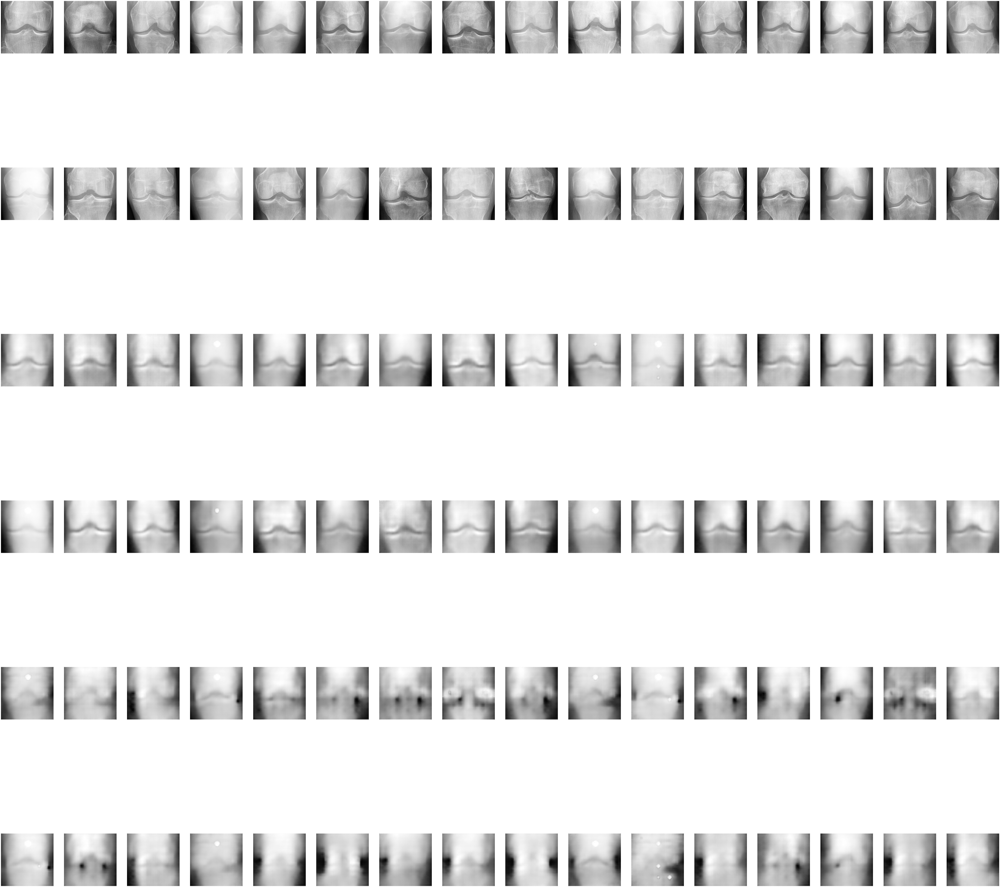

In [2]:
fig, axs = plt.subplots(6, img0.shape[0], figsize = (128, 128))
# fig_ = decoder(encoder(real_imgs_l.detach())[1]+encoder(real_imgs_l.detach())[0])
for idx,(ax1,ax2,ax3,ax4,ax5,ax6) in enumerate(axs.T):
    ax1.imshow(img0[idx,0,:,:].detach().cpu().numpy(),cmap='gray')
    ax2.imshow(img2[idx,0,:,:].detach().cpu().numpy(),cmap='gray')
    ax3.imshow(R_img0[idx,0,:,:].detach().cpu().numpy(),cmap='gray')
    ax4.imshow(R_img2[idx,0,:,:].detach().cpu().numpy(),cmap='gray')
    ax5.imshow(Key_Exchange_img0[idx,0,:,:].detach().cpu().numpy(),cmap='gray')
    ax6.imshow(Key_Exchange_img2[idx,0,:,:].detach().cpu().numpy(),cmap='gray')
    ax1.axis('off')
    ax2.axis('off')
    ax3.axis('off')
    ax4.axis('off')
    ax5.axis('off')
    ax6.axis('off')
#break

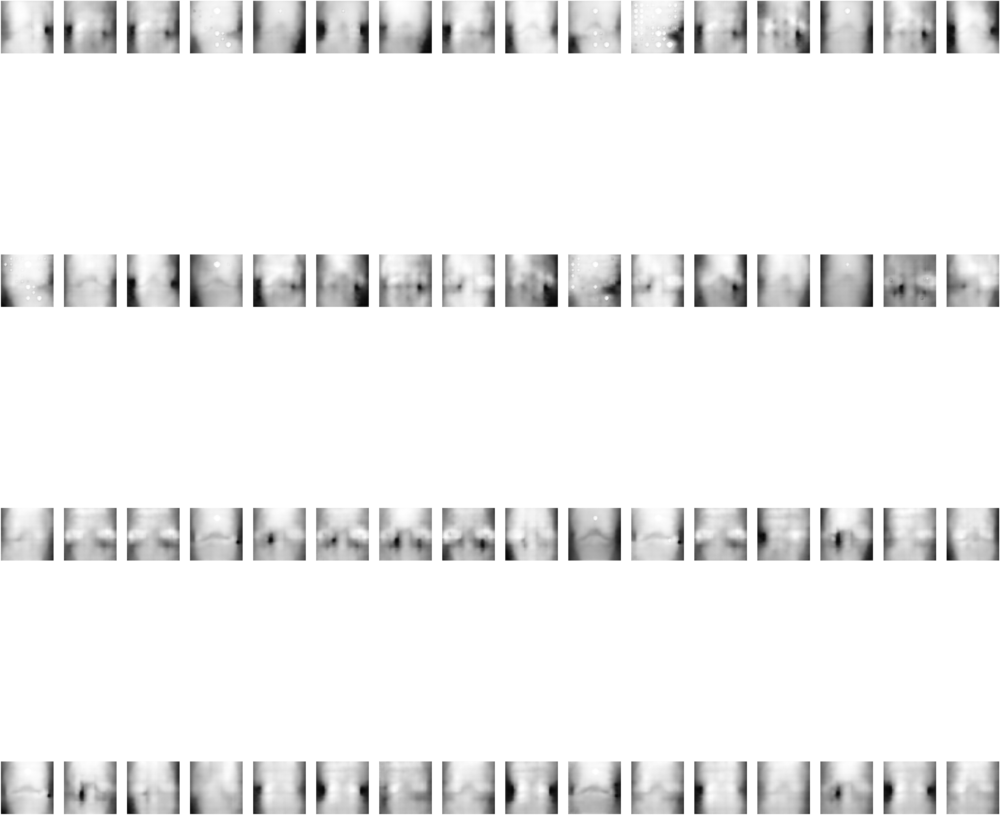

In [3]:
fig, axs = plt.subplots(4, img0.shape[0], figsize = (128, 128))
# fig_ = decoder(encoder(real_imgs_l.detach())[1]+encoder(real_imgs_l.detach())[0])
for idx,(ax1,ax2,ax3,ax4) in enumerate(axs.T):
    ax1.imshow(decoder(vector_Key0)[idx,0,:,:].detach().cpu().numpy(),cmap='gray')
    ax2.imshow(decoder(vector_Key2)[idx,0,:,:].detach().cpu().numpy(),cmap='gray')
    ax3.imshow(decoder(vector_Unrelated0)[idx,0,:,:].detach().cpu().numpy(),cmap='gray')
    ax4.imshow(decoder(vector_Unrelated2)[idx,0,:,:].detach().cpu().numpy(),cmap='gray')
    ax1.axis('off')
    ax2.axis('off')
    ax3.axis('off')
    ax4.axis('off')

In [9]:
torch.save(encoder, 'paper_test_encoder.pth')
torch.save(decoder,'paper_test_decoder.pth')
torch.save(discriminator2,'paper_test_siamese.pth')

# 128*128

In [ ]:
import argparse
import os
import numpy as np
import math
import sys
import torchvision.transforms as transforms
from torchvision.utils import save_image
from torch.utils.data import DataLoader
from torchvision import datasets
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
import torch
import torchvision.utils as vutils
import numpy as np
import torch
import torch.nn as nn
import os
import csv
from PIL import Image, ImageEnhance
import numbers
import pandas as pd
import torchvision.transforms as transforms
import torch.utils.data as data
from torch.autograd import Variable
import matplotlib.pyplot as plt
from torch import autograd

img_shape = (1, 128, 128)

cuda = True if torch.cuda.is_available() else False

def weights_init_uniform(m):
    if isinstance(m, nn.Conv2d):
        nn.init.kaiming_uniform(m.weight.data)
        m.bias.data.fill_(0.1)

    if isinstance(m, nn.Linear):
        nn.init.kaiming_uniform(m.weight.data)
        m.bias.data.fill_(0.1)


# block 32 64 128 256 represent how many channel for conv3 in this block 
# and the image dimension after convolution is presented
class Block32(nn.Module):
    def __init__(self):
        super().__init__()
        self.block = nn.Sequential(
            # input --> 1 * 128 * 128
            nn.Conv2d(1, 32, kernel_size=3, stride=1, padding=0),  # 32 * 126 * 126
            # normalization
            nn.BatchNorm2d(32, eps=1e-5),
            #  activate function
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=0),  # 32 * 124 * 124
            nn.BatchNorm2d(32, eps=1e-5),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        output = self.block(x)
        return output


class Block64(nn.Module):
    def __init__(self):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=0),  # 64 * 61 * 61
            nn.BatchNorm2d(64, eps=1e-5),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=0),  # 64 * 59 * 59
            nn.BatchNorm2d(64, eps=1e-5),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=0),  # 64 * 57 * 57
            nn.BatchNorm2d(64, eps=1e-5),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        output = self.block(x)
        return output


class Block128(nn.Module):
    def __init__(self):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=0),  # 128 * 28 * 28
            nn.BatchNorm2d(128, eps=1e-5),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=0),  # 128 * 26 * 26
            nn.BatchNorm2d(128, eps=1e-5),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=0),  # 128 * 24 * 24
            nn.BatchNorm2d(128, eps=1e-5),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=0),  # 128 * 22 * 22
            nn.BatchNorm2d(128, eps=1e-5),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        output = self.block(x)
        return output


class Block256(nn.Module):
    def __init__(self):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=0),  # 256 * 10 * 10
            nn.BatchNorm2d(256, eps=1e-5),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=0),  # 256 * 8 * 8
            nn.BatchNorm2d(256, eps=1e-5),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=0),  # 256 * 6 * 6
            nn.BatchNorm2d(256, eps=1e-5),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=0),  # 256 * 4 * 4
            nn.BatchNorm2d(256, eps=1e-5),
            nn.ReLU(inplace=True)
            # nn.Conv2d(256, 256, kernel_size=4, stride=1, padding=0),  # 256 * 1 * 1
            # nn.BatchNorm2d(256, eps=1e-5),
            # nn.ReLU(inplace=True)
        )

    def forward(self, x):
        output = self.block(x)
        return output


# channelattention
class ChannelAttention(nn.Module):
    def __init__(self, kernel):
        super(ChannelAttention, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.fc1 = nn.Conv2d(kernel, kernel // 8, 1, bias=False)
        self.relu1 = nn.ReLU()
        self.fc2 = nn.Conv2d(kernel // 8, kernel, 1, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = self.fc2(self.relu1(self.fc1(self.avg_pool(x))))
        max_out = self.fc2(self.relu1(self.fc1(self.max_pool(x))))
        out = avg_out + max_out
        return x * self.sigmoid(out)


# spatialattention(I did try to combine CA with SA but the result was not very good as espected)
class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()
        assert kernel_size in (3, 7), 'kernel size must be 3 or 7'
        padding = 3 if kernel_size == 7 else 1
        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        y = torch.cat([avg_out, max_out], dim=1)
        y = self.conv1(y)
        return x * self.sigmoid(y)


class Siamese_VGG(nn.Module):
    def __init__(self, drop, use_w_init=True):
        super().__init__()

        # blocks
        self.block32 = Block32()
        self.block64 = Block64()
        self.block128 = Block128()
        self.block256 = Block256()

        # only one fully connecter was used
        self.final = nn.Sequential(
            nn.Dropout(p=drop),
            # combine all features to 2 dimention because of binaire classfication
            nn.Linear(32 + 64 + 128 + 256, 2)
        )

        # initialization of the weights and bias 
        if use_w_init:
            self.apply(weights_init_uniform)

        # channel attention
        self.attention32 = ChannelAttention(32)
        self.attention64 = ChannelAttention(64)
        self.attention128 = ChannelAttention(128)
        self.attention256 = ChannelAttention(256)

    def forward(self, x1, x2):
        # forward propagation
        o1 = self.block32(x1)
        o2 = self.block32(x2)
        att_o1 = self.attention32(o1)
        att_o2 = self.attention32(o2)
        # use GAP to extract the features after the block
        feats1_1 = torch.nn.functional.adaptive_avg_pool2d(o1, (1, 1))
        feats1_2 = torch.nn.functional.adaptive_avg_pool2d(o2, (1, 1))
        # use add bit-by-bit to combine 2 GAP
        feats1 = feats1_1.view((feats1_1).size(0), -1) + feats1_2.view((feats1_2).size(0), -1)

        # now input = output from last block + channel attention
        o1 = self.block64(o1 + att_o1)
        o2 = self.block64(o2 + att_o2)
        att_o1 = self.attention64(o1)
        att_o2 = self.attention64(o2)
        feats2_1 = torch.nn.functional.adaptive_avg_pool2d(o1, (1, 1))
        feats2_2 = torch.nn.functional.adaptive_avg_pool2d(o2, (1, 1))
        feats2 = feats2_1.view((feats2_1).size(0), -1) + feats2_2.view((feats2_2).size(0), -1)

        o1 = self.block128(o1 + att_o1)
        o2 = self.block128(o2 + att_o2)
        att_o1 = self.attention128(o1)
        att_o2 = self.attention128(o2)
        feats3_1 = torch.nn.functional.adaptive_avg_pool2d(o1, (1, 1))
        feats3_2 = torch.nn.functional.adaptive_avg_pool2d(o2, (1, 1))
        feats3 = feats3_1.view((feats3_1).size(0), -1) + feats3_2.view((feats3_2).size(0), -1)

        o1 = self.block256(o1 + att_o1)
        o2 = self.block256(o2 + att_o2)
        # att_o1 = self.attention256(o1)
        # att_o2 = self.attention256(o2)
        feats4_1 = torch.nn.functional.adaptive_avg_pool2d(o1, (1, 1))
        feats4_2 = torch.nn.functional.adaptive_avg_pool2d(o2, (1, 1))
        feats4 = feats4_1.view((feats4_1).size(0), -1) + feats4_2.view((feats4_2).size(0), -1)  #

        # combine all GAPs to get the final features
        feats_final = torch.cat([feats1, feats2], 1)
        feats_final = torch.cat([feats_final, feats3], 1)
        feats_final = torch.cat([feats_final, feats4], 1)

        return self.final(feats_final), feats_final
    
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        self.main = nn.Sequential(
            # k+(in-1)s-2p
            nn.ConvTranspose2d(2048, 128*32, 4, 1, 0, bias=False), # 4096, 4, 4
            nn.BatchNorm2d(128 * 32),
            nn.ReLU(True),
            nn.ConvTranspose2d(128*32, 128 * 16, 4, 2, 1, bias=False), # 2048, 8, 8 # 8
            nn.BatchNorm2d(128 * 16),
            nn.ReLU(True),
            # input is Z, going into a convolution
            nn.ConvTranspose2d(128 * 16, 128 * 8, 4, 2, 0, bias=False), # 1024, 20, 20 # 18
            nn.BatchNorm2d(128 * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(128 * 8, 128 * 4, 4, 2, 1, bias=False), # 512, 40, 40 # 36
            nn.BatchNorm2d(128 * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(128 * 4, 128 * 2, 4, 2, 0, bias=False), # 256, 80, 80 # 74
            nn.BatchNorm2d(128 * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(128 * 2, 128, 4, 2, 1, bias=False), # 128, 160, 160 # 128, # 148
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d(128, 1, 7, 2, 1, bias=False), # 1, 320, 320   # 1,299,299 # 299
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, z):
        # print(z.shape)
        img = self.main(z)
        # print(img.size())
        # img = img.view(img.shape[0], *img_shape)
        return img

    
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        self.encoder1 = nn.Sequential(
            # input is 1 x 128 x 128 1*299*299
            nn.Conv2d(1, 32, 3, 2, 0, bias=False),  # 32*63*63 32*149*149
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(32, 32 * 2, 3, 2, 0, bias=False),  # 64*31*31 64*74*74
            nn.BatchNorm2d(32 * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(32 * 2, 32 * 4, 3, 2, 0, bias=False),  # 128*15*15 128*36*36
            nn.BatchNorm2d(32 * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(32 * 4, 32 * 8, 3, 2, 0, bias=False),  # 256*7*7 256*17*17
            nn.BatchNorm2d(32 * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(32 * 8, 32 * 16, 3, 2, 0, bias=False),  # 512*3*3 512 * 8 * 8
            nn.BatchNorm2d(32 * 16),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(32 * 16, 32 * 32, 3, 2, 0, bias=False),  # 1024*1*1 1024 * 3* 3
            nn.BatchNorm2d(32 * 32),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(32 * 32, 32 * 64, 3, 2, 0, bias=False),  # 2048*1*1 2048 * 1* 1
            nn.BatchNorm2d(32 * 64),
            nn.LeakyReLU(0.2, inplace=True),
        )
        self.encoder2 = nn.Sequential(
            # input is 1 x 128 x 128
            nn.Conv2d(1, 32, 3, 2, 0, bias=False),  # 32*63*63
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(32, 32 * 2, 3, 2, 0, bias=False),  # 64*31*31
            nn.BatchNorm2d(32 * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(32 * 2, 32 * 4, 3, 2, 0, bias=False),  # 128*15*15
            nn.BatchNorm2d(32 * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(32 * 4, 32 * 8, 3, 2, 0, bias=False),  # 256*7*7
            nn.BatchNorm2d(32 * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(32 * 8, 32 * 16, 3, 2, 0, bias=False),  # 512*3*3
            nn.BatchNorm2d(32 * 16),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(32 * 16, 32 * 32, 3, 2, 0, bias=False),  # 1024*1*1
            nn.BatchNorm2d(32 * 32),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(32 * 32, 32 * 64, 3, 2, 0, bias=False),  # 1024*1*1
            nn.BatchNorm2d(32 * 64),
            nn.LeakyReLU(0.2, inplace=True),
        )
    def forward(self, img):
        # print(img.size())
        output1 = self.encoder1(img)
        output2 = self.encoder2(img)
        return output1,output2
    
    
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


def get_pair(I):
    s = I.size[0]
    pad = int(np.floor(s / 3))
    ps = 128
    l = I.crop([0, pad, ps, pad + ps])
    m = I.crop([s - ps, pad, s, pad + ps])
    m = m.transpose(Image.FLIP_LEFT_RIGHT)

    return l, m


class KneeGradingDataset(data.Dataset):
    def __init__(self, dataset, train_files, transform, augment, stage='train'):
        super(KneeGradingDataset, self).__init__()
        self.dataset = dataset
        self.train_files = train_files
        self.transform = transform
        self.augment = augment
        self.stage = stage
        if self.stage == 'train':
            self.images, self.labels = self.load_csv("paper_0_2.csv")
        if self.stage == 'valid':
            self.images, self.labels = self.load_csv("trainData_0_2.csv")

    def load_csv(self, filename):
        images, labels = [], []
        with open(os.path.join(self.dataset, filename)) as f:
            reader = csv.reader(f)
            for row in reader:
                img_0, l_0, img_2, l_2 = row
                # print(img_0, img_2)
                label_0 = int(l_0)
                label_2 = int(l_2)       
                images.append([img_0, img_2])
                labels.append([label_0,label_2])
                #print(labels)
                #break
        return images, labels

    def __getitem__(self, index):
        img_0, img_2, label_0, label_2 = self.images[index][0], self.images[index][1], self.labels[index][0],self.labels[index][1]
        fname = os.path.join(self.dataset, img_0[0], img_0)
        fname2 = os.path.join(self.dataset, img_2[0], img_2)
        img = Image.open(fname)
        img2 = Image.open(fname2)
        img = self.augment(img)
        img2 = self.augment(img2)
        
        l, m = get_pair(img)
        l2, m2 = get_pair(img2)
        
        l = self.transform(l)
        m = self.transform(m)
        
        l2 = self.transform(l2)
        m2 = self.transform(m2)
        
        img = self.transform(img)
        img2 = self.transform(img2)
        # print(label_0)
        return img, img2, l, m, l2, m2, label_0, label_2

    def __len__(self):
        # return len(self.train_files)
        return 4494400


class CenterCrop(object):
    def __init__(self, size):
        if isinstance(size, numbers.Number):
            self.size = (int(size), int(size))
        else:
            self.size = size

    def __call__(self, img):
        w, h = img.size
        tw, th, = self.size
        x1 = int(round((w - tw) / 2.))
        y1 = int(round((h - th) / 2.))
        return img.crop((x1, y1, x1 + tw, y1 + th))


class distance_loss(nn.Module):
    def __init__(self):
        super(distance_loss, self).__init__()

    def forward(self, x1,x2):
        mean_no_related = torch.mean(x1)
        mean_key = torch.mean(x2)
        var_no_related = torch.var(x1)
        var_key = torch.var(x2)
        
        loss = (var_no_related + var_key) / torch.square(mean_no_related - mean_key)

        return loss.mean()

def get_pair_Tensor(I):
    tensor_l = torch.flip(I[:,:,100:228,171:299][0].cpu(), [-1]).unsqueeze(1)
    tensor_m = I[:,:,100:228,0:128][0].unsqueeze(1)
    for i in range(I.shape[0]-1):
        tensor_l = torch.cat((tensor_l, torch.flip(I[:,:,100:228,171:299][i+1].cpu(), [-1]).unsqueeze(1)), 0)
        tensor_m = torch.cat((tensor_m, I[:,:,100:228,0:128][i+1].unsqueeze(1)), 0) 

    return tensor_l,tensor_m

# Initialize generator and discriminator
# discriminator = Discriminator()
discriminator2 = Siamese_VGG(0.2)
encoder = Encoder()
decoder = Decoder()

CUDA = 0

if cuda:
    #discriminator.cuda(CUDA)
    #discriminator.apply(weights_init)
    discriminator2.cuda(CUDA)
    discriminator2.apply(weights_init)
    encoder.cuda(CUDA)
    encoder.apply(weights_init)
    decoder.cuda(CUDA)
    decoder.apply(weights_init)

# Configure data loader
train_cats_length = []
val_length = []
test_length = []
if True:
    for kl in [0, 2]:
        train_cats_length.append(int(len(os.listdir(
            os.path.join('./OAI_m', str(kl))  # 找出各个等级的数量 * 0.6 作为训练集
        )) * 0.8))
        val_length.append(int(len(os.listdir(
            os.path.join('./OAI_m', str(kl))  # 找出各个等级的数量 * 0.2 作为验证集
        )) * 0.2))
    # print(train_cats_length)
    # print(val_length)
    oversample_size = int(sum(train_cats_length) / 2)
    train_files = []
    # print(oversample_size)
    # np.random.seed(42)
    for kl, index in [0, 0], [2, 1]:
        files = np.array(os.listdir(
            os.path.join('./OAI_m', str(kl))
        )[:train_cats_length[index]])
        # print((files))
        train_files.extend(
            np.random.choice(
                files, size=oversample_size, replace=True
            ).tolist()
        )
    # print((train_files))  # 在每个等级中采样，个数为平均个数。
    train_files = np.array(train_files)
    trainData = train_files
    label = []
    for j in range(len(train_files)):
        if int(train_files[j][0]) == 0:
            binaire_label = 0
        else:
            binaire_label = 1
        label.append(binaire_label)
    # print(label)
    label = pd.DataFrame(label)

    trainData = pd.DataFrame(train_files)
    trainData = pd.concat([trainData, label], axis=1)
    trainData.to_csv('./OAI_m/trainData_0_2.csv', index=False, header=False)  # 图片与标签csv

    # print(np.shape(train_files))
    # np.random.shuffle(train_files)  # 打乱顺序 到此为处理完毕的训练集

    val_files = []
    for kl, index in [0, 0], [2, 1]:
        val = np.array(os.listdir(
            os.path.join('./OAI_m', str(kl))
        )[train_cats_length[index]:(train_cats_length[index] + val_length[index])])
        val_files.extend(val)
    val_files = np.array(val_files)
    # print(val_files) # 到此为处理完毕的验证集

    label = []
    for j in range(len(val_files)):
        if int(val_files[j][0]) == 0:
            binaire_label = 0
        else:
            binaire_label = 1
        label.append(binaire_label)
    # print(label)
    label = pd.DataFrame(label)
    valData = pd.DataFrame(val_files)
    valData = pd.concat([valData, label], axis=1)
    valData.to_csv('./OAI_m/valData_0_2.csv', index=False, header=False)  # 图片与标签csv
    
transf_tens = transforms.Compose([
    transforms.ToTensor()
])
augment_transforms = transforms.Compose([
    CenterCrop(299)
])

train_ds = KneeGradingDataset('./OAI_m', trainData, transform=transf_tens, augment=augment_transforms, stage='train')
train_loader = data.DataLoader(train_ds, batch_size=100, shuffle=True)

#optimizer_D = torch.optim.Adam(discriminator.parameters(),lr=0.0002)
optimizer_D_ = torch.optim.Adam(discriminator2.parameters(),lr=0.001)
optimizer_E = torch.optim.Adam(encoder.parameters(),lr=0.001)
optimizer_DE = torch.optim.Adam(decoder.parameters(),lr=0.001)

Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

# ----------
#  Training
# ----------

batches_done = 0
device = torch.device("cuda:" + str(CUDA) if (torch.cuda.is_available()) else "cpu")

loss_Ds = []
loss_Gs = []
mse = nn.MSELoss()
loss_Dis = distance_loss()

loss_Ds = []
loss_Rs = []
loss_Distances = []
loss_CEs = []

for epoch in range(5):
    for i, (img, img2, l, m, l2, m2, label_0, label_2) in enumerate(train_loader):
        # print(label_0)
        img0 = Variable(img.cuda(CUDA))
        img2 = Variable(img2.cuda(CUDA))
        l0 = Variable(l.cuda(CUDA))
        l2 = Variable(l2.cuda(CUDA))
        m0 = Variable(m.cuda(CUDA))
        m2 = Variable(m2.cuda(CUDA))
        label_0 = Variable(label_0.long().cuda(CUDA))
        label_2 = Variable(label_2.long().cuda(CUDA))
        # real_imgs = torch.cat((real_imgs_l,real_imgs_r),dim=0)    
        
        vector_Key0 = encoder(img0)[0]   
        vector_Unrelated0 = encoder(img0)[1]        
        vector_img0 = vector_Key0 + vector_Unrelated0
        
        vector_Key2 = encoder(img2)[0]
        vector_Unrelated2 = encoder(img2)[1]        
        vector_img2 = vector_Key2 + vector_Unrelated2
        
        vector_Key_Exchange_img0 = vector_Key2 + vector_Unrelated0
        vector_Key_Exchange_img2 = vector_Key0 + vector_Unrelated2
        
        R_img0 = decoder(vector_img0)
        R_img2 = decoder(vector_img2)
        
        Key_Exchange_img0 = decoder(vector_Key_Exchange_img0)
        Key_Exchange_img2 = decoder(vector_Key_Exchange_img2)
        
        # print(Key_Exchange_img0.size())
        Key_Exchange_img0_l = get_pair_Tensor(Key_Exchange_img0)[0].cuda(CUDA)
        Key_Exchange_img0_m = get_pair_Tensor(Key_Exchange_img0)[1].cuda(CUDA)
        
        Key_Exchange_img2_l = get_pair_Tensor(Key_Exchange_img2)[0].cuda(CUDA)
        Key_Exchange_img2_m = get_pair_Tensor(Key_Exchange_img2)[1].cuda(CUDA)
        
        optimizer_D_.zero_grad()
        
        for p in discriminator2.parameters():
            p.requires_grad = True
            
        loss_D1 = F.cross_entropy(discriminator2(l0,m0)[0],label_0)
        loss_D2 = F.cross_entropy(discriminator2(l2,m2)[0],label_2)
        loss_D = loss_D1 + loss_D2
        loss_Ds.append(loss_D)
        loss_D.backward()
        optimizer_D_.step()
        
        #loss_Ds.append(loss_D)
        
        optimizer_E.zero_grad()
        optimizer_DE.zero_grad()
        
        for p in discriminator2.parameters():
            p.requires_grad = False
            
        loss_distance0 = loss_Dis(vector_Key0, vector_Unrelated0)
        loss_distance2 = loss_Dis(vector_Key2, vector_Unrelated2)
        
        loss_distance = loss_distance0 + loss_distance2
        loss_Distances.append(loss_distance)
        
        loss_R0 = mse(img0, R_img0)
        loss_R2 = mse(img2, R_img2)
        
        loss_R = loss_R0 + loss_R2
        loss_Rs.append(loss_R)
        
        loss_ce0 = F.cross_entropy(discriminator2(Key_Exchange_img0_l, Key_Exchange_img0_m)[0],label_2)
        loss_ce2 = F.cross_entropy(discriminator2(Key_Exchange_img2_l, Key_Exchange_img2_m)[0],label_0)
        
        loss_ce = loss_ce0 + loss_ce2
        loss_CEs.append(loss_ce)
        
        loss_total = loss_R + 0.00000 * loss_distance + 0.01 * loss_ce
        loss_total.backward()
        
        #loss_Gs.append(loss_G)
        
        optimizer_E.step()
        optimizer_DE.step()
        
        print("[Epoch %d/%d] [Batch %d/%d] [loss_R: %f][loss_D: %f][loss_Dis: %f][loss_CE: %f]" % (epoch, 5, batches_done % len(train_loader), len(train_loader),loss_R.item(), loss_D.item(),loss_distance.item(),loss_ce.item()))
        batches_done += 1
        
        torch.save(encoder, 'paper_CAE_encoder_epoch_' + str(batches_done) + '.pth')
        torch.save(decoder,'paper_CAE_decoder_epoch_' + str(batches_done) + '.pth')
        torch.save(discriminator2,'paper_CAE_siamese_epoch_' + str(batches_done) + '.pth')